# Predicción de precios de Bitcoin mediante técnicas de Forecasting¶
## Elaborado por: Ronny Meza

In [1]:
#Librerias
import os
import numpy as np
import pandas as pd
import pickle
import quandl
from datetime import datetime
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)
from datetime import date, timedelta
from dateutil.parser import parse
import pandas as pd
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.dates as mdates
from scipy.signal import savgol_filter
import seaborn as sns

from scipy import stats
from sklearn.metrics import mean_squared_error
from math import sqrt
from random import randint
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import GRU
from keras.callbacks import EarlyStopping
from keras import initializers
from matplotlib import pyplot
from datetime import datetime
from matplotlib import pyplot as plt
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)
%matplotlib inline
import statsmodels.api as sm
import itertools

import warnings
warnings.filterwarnings("ignore")

#Recuperacion de los precios del Bitcoin utilizando el Api Quandl, para adquirir los datos se requiere de una clave
quandl.ApiConfig.api_key = '9xDDcwCoVbqfi1LxtrHv'

Using TensorFlow backend.


In [2]:
# Extraccion de los precios de intercambio del kraken directamente en euros
btc_eur_price_kraken = quandl.get('BCHARTS/KRAKENEUR', start_date="2014-01-01", end_date=date.today())

In [3]:
#Inspeccion de los datos
btc_eur_price_kraken.head()
#print(btc_eur_price_kraken) 

,Open,High,Low,Close,Volume (BTC),Volume (Currency),Weighted Price
Date,,,,,,,
2014-01-08,624.01000,640.00000,600.00000,613.47231,331.481650,204958.394492,618.309926
2014-01-09,613.47231,626.99990,590.00000,614.22456,583.334331,355744.845866,609.847265
2014-01-10,615.00000,630.00000,605.00000,625.73866,323.047379,199327.057887,617.021127
2014-01-11,626.17401,658.99999,623.30000,653.89888,561.256792,361578.576476,644.230202
2014-01-12,653.89888,659.98000,613.00555,625.26660,477.757931,302729.099050,633.645366


In [4]:
# Generacion de un grafico simple para evaluar la fluctuación (1)
from plotly.graph_objs import *

btc_trace = go.Scatter(x=btc_eur_price_kraken.index, y=btc_eur_price_kraken['Weighted Price'])

data=go.Data([btc_trace])
layout = go.Layout(title='Gráfico de Fluctuación del Precio ponderado del Bitcoin',xaxis={'title':'Fecha'}, yaxis={'title':'Precio (EU)'})
figure=go.Figure(data=data,layout=layout)

#py.image.save_as(figure, filename='1_Weighted Price.png')

py.iplot(figure, filename='1_Weighted Price')




In [5]:
#Debido a las bajadas abrutas se procede a descargar los datos de otras paginas
# Pull pricing data for 3 more BTC exchanges
exchanges = ['COINBASE','BITSTAMP','ITBIT']

exchange_data = {}

exchange_data['KRAKEN'] = btc_eur_price_kraken

for exchange in exchanges:
    exchange_code = 'BCHARTS/{}EUR'.format(exchange)
    btc_exchange_df = quandl.get(exchange_code, start_date="2014-01-01", end_date=date.today())
    exchange_data[exchange] = btc_exchange_df

In [6]:
#Creacion de una funcion para fusionar base de datos
def merge_dfs_on_column(dataframes, labels, col):
    '''Merge a single column of each dataframe into a new combined dataframe'''
    series_dict = {}
    for index in range(len(dataframes)):
        series_dict[labels[index]] = dataframes[index][col]
        
    return pd.DataFrame(series_dict)

In [7]:
# Fusion de las base de datos
btc_eur_datasets = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Weighted Price')

#Datos para la construccion de los graficos de Velas
candlestick_open = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Open')
candlestick_high = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'High')
candlestick_low = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Low')
candlestick_close = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Close')

In [8]:
# Previsualizacion de los resultados
btc_eur_datasets.tail()

,KRAKEN,COINBASE,BITSTAMP,ITBIT
Date,,,,
2018-09-15,5610.906582,5623.260200,5613.322034,5608.267239
2018-09-16,5563.882659,5582.082281,5569.103945,5540.571591
2018-09-17,5434.386679,5444.369812,5436.330109,5406.054764
2018-09-18,5400.358731,5406.612313,5401.802059,5418.100711
2018-09-19,5419.520029,5428.165066,5412.861561,5441.571620


In [9]:
# Previsualizacion de los resultados para Open
candlestick_open.tail()

,KRAKEN,COINBASE,BITSTAMP,ITBIT
Date,,,,
2018-09-15,5573.9,5588.65,5586.80,5604.58
2018-09-16,5602.9,5624.31,5618.10,5575.80
2018-09-17,5586.8,5596.69,5595.40,5592.55
2018-09-18,5355.8,5372.01,5367.55,5347.78
2018-09-19,5423.5,5445.00,5432.77,5421.47


In [10]:
#Funcion para comparar los precios de las diferentes bases de datos y construir un grafico de dispersion
def df_scatter(df, title, seperate_y_axis=False, y_axis_label='', scale='linear', initial_hide=False):
    '''Construye un grafico de dispersion con los datos del dataFrame'''
    label_arr = list(df)
    series_arr = list(map(lambda col: df[col], label_arr))
    
    layout = go.Layout(
        title=title,
        legend=dict(orientation="h"),
        xaxis=dict(type='date'),
        yaxis=dict(
            title=y_axis_label,
            showticklabels= not seperate_y_axis,
            type=scale
        )
    )
    
    y_axis_config = dict(
        overlaying='y',
        showticklabels=False,
        type=scale )
    
    visibility = 'visible'
    if initial_hide:
        visibility = 'legendonly'
        
    # Form Trace For Each Series
    trace_arr = []
    for index, series in enumerate(series_arr):
        trace = go.Scatter(
            x=series.index, 
            y=series, 
            name=label_arr[index],
        )
        
        # Add seperate axis for the series
        if seperate_y_axis:
            trace['yaxis'] = 'y{}'.format(index + 1)
            layout['yaxis{}'.format(index + 1)] = y_axis_config    
        trace_arr.append(trace)

    fig = go.Figure(data=trace_arr, layout=layout)
    py.iplot(fig)

In [11]:
# Grafico de todos los precios del Bitcoin
df_scatter(btc_eur_datasets, 'Precios del Bitcoin al cambio (EUR)')

In [12]:
# Grafico de los precios del Bitcoin a la apertura
df_scatter(candlestick_open, 'Precios del Bitcoin (Open) al cambio (EUR)')

In [13]:
# Grafico de los precios del Bitcoin a la alza 
df_scatter(candlestick_high, 'Precios del Bitcoin (High) al cambio (EUR)')

In [14]:
# Grafico de los precios del Bitcoin a la baja
df_scatter(candlestick_low, 'Precios del Bitcoin (Low) al cambio (EUR)')

In [15]:
# Grafico de los precios del Bitcoin al cierre 
df_scatter(candlestick_close, 'Precios del Bitcoin (Close) al cambio (EUR)')

In [16]:
#Remocion de valores nulos para los precios ponderados
btc_eur_datasets.replace(0, np.nan, inplace=True)

#Remocion de valores nulos para las diferentes cotizaciones diarias
candlestick_open.replace(0, np.nan, inplace=True)
candlestick_high.replace(0, np.nan, inplace=True)
candlestick_low.replace(0, np.nan, inplace=True)
candlestick_close.replace(0, np.nan, inplace=True)

#Previsualizacion de los datos
btc_eur_datasets.tail()

,KRAKEN,COINBASE,BITSTAMP,ITBIT
Date,,,,
2018-09-15,5610.906582,5623.260200,5613.322034,5608.267239
2018-09-16,5563.882659,5582.082281,5569.103945,5540.571591
2018-09-17,5434.386679,5444.369812,5436.330109,5406.054764
2018-09-18,5400.358731,5406.612313,5401.802059,5418.100711
2018-09-19,5419.520029,5428.165066,5412.861561,5441.571620


In [17]:
# Grafico de los datos de precio ponderados limpios (6)
df_scatter(btc_eur_datasets, 'Precios del Bitcoin al Cambio (EUR)')

In [18]:
# Grafico de los datos de precios a la apertura limpios (7)
df_scatter(candlestick_open, 'Precios del Bitcoin (Open) al Cambio (EUR)')

In [19]:
# Grafico de los datos de precios a la alza limpios (8)
df_scatter(candlestick_high, 'Precios del Bitcoin (High) al Cambio (EUR)')

In [20]:
# Grafico de los datos de precios a la baja limpios (9)
df_scatter(candlestick_low, 'Precios del Bitcoin (Low) al Cambio (EUR)')

In [21]:
# Grafico de los datos de precios al cierre limpios (10)
df_scatter(candlestick_close, 'Precios del Bitcoin (Close) al Cambio (EUR)')

In [22]:
# Calculo del valor promedio del precio ponderado de venta 
btc_eur_datasets['avg_btc_price_eur'] = btc_eur_datasets.mean(axis=1)

# Calculo del valor promedio del precio de cotizacion 
candlestick_open['avg_price'] = candlestick_open.mean(axis=1)
candlestick_high['avg_price'] = candlestick_high.mean(axis=1)
candlestick_low['avg_price'] = candlestick_low.mean(axis=1)
candlestick_close['avg_price'] = candlestick_close.mean(axis=1)

btc_eur_datasets.tail()

,KRAKEN,COINBASE,BITSTAMP,ITBIT,avg_btc_price_eur
Date,,,,,
2018-09-15,5610.906582,5623.260200,5613.322034,5608.267239,5613.939014
2018-09-16,5563.882659,5582.082281,5569.103945,5540.571591,5563.910119
2018-09-17,5434.386679,5444.369812,5436.330109,5406.054764,5430.285341
2018-09-18,5400.358731,5406.612313,5401.802059,5418.100711,5406.718453
2018-09-19,5419.520029,5428.165066,5412.861561,5441.571620,5425.529569


In [23]:
# Grafico del valor promedio del precio ponderado de venta (13)
open_trace = go.Scatter(x=btc_eur_datasets.index, y=candlestick_open['avg_price'])
data=go.Data([btc_trace])
layout = go.Layout(title='Precio de apertura (Open) Promedio del Bitcoin',xaxis={'title':'Fecha'}, yaxis={'title':'Precio (EU)'})
figure=go.Figure(data=data,layout=layout)

py.iplot(figure, filename='1_Weighted Price')

# Construcción de Gráficos Candlesticks

In [129]:
import plotly
import plotly.plotly as py
import plotly.graph_objs as go

#Para utilizar la libreria grafica plotly.tools, se debe crear un usuario y password como lo indica la pagina 
#https://plot.ly/python/getting-started/

plotly.tools.set_credentials_file(username='mezaacor', api_key='hQQALc8m6bjip1fDiv9c')

btc_eur_price_kraken.replace(0, np.nan, inplace=True)

trace = go.Candlestick(x=btc_eur_price_kraken.index, open=candlestick_open['avg_price'], high=candlestick_high['avg_price'], low=candlestick_low['avg_price'], close=candlestick_close['avg_price'])

data = [trace]

#py.iplot(data, filename='simple_candlestick', title='Plot Title')

layout = go.Layout(
    title='Gráficos de Vela del Precio de Mercado del Bitcoin',
    xaxis=dict(
        title='Fluctuación por Día',
        titlefont=dict(
            family='Arial, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Cotización del Bitcoin (EUR)',
        titlefont=dict(
            family='Arial, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)
fig = go.Figure(data=data, layout=layout)

#plot_url = py.plot(fig, filename='styling-names')
py.iplot(fig, filename='styling-names')

In [25]:
# Grafico del valor promedio del precio ponderado de venta (12)
btc_trace = go.Scatter(x=btc_eur_datasets.index, y=btc_eur_datasets['avg_btc_price_eur'])
data=go.Data([btc_trace])
layout = go.Layout(title='Gráfico de Fluctuación del Precio Promedio del Bitcoin',xaxis={'title':'Fecha'}, yaxis={'title':'Precio (EU)'})
figure=go.Figure(data=data,layout=layout)

py.iplot(figure, filename='1_Weighted Price')

In [26]:
# Previsualizacion de los resultados, la ultima columna son los datos depurados
btc_eur_datasets.tail()

,KRAKEN,COINBASE,BITSTAMP,ITBIT,avg_btc_price_eur
Date,,,,,
2018-09-15,5610.906582,5623.260200,5613.322034,5608.267239,5613.939014
2018-09-16,5563.882659,5582.082281,5569.103945,5540.571591,5563.910119
2018-09-17,5434.386679,5444.369812,5436.330109,5406.054764,5430.285341
2018-09-18,5400.358731,5406.612313,5401.802059,5418.100711,5406.718453
2018-09-19,5419.520029,5428.165066,5412.861561,5441.571620,5425.529569


In [27]:
#Creacion de los datos de entrenamiento y prueba
d0 = date(2014, 1, 1)
d1 = date(2017, 12, 17)
delta = d1 - d0
days_look = delta.days + 1
print(days_look)

#Se toma la ventana de analisis hasta el dia de ayer
d0 = date(2017, 12, 18)
#d1 = date(2018,7, 31)
d1 = date.today()
delta = d1 - d0
days_from_train = delta.days +1
print(days_from_train)

#d0 = date(2018,7, 31) + timedelta(1)
#d1 = date(2018,7, 31) + timedelta(7)
d0 = date.today() + timedelta(1)
d1 = date.today() + timedelta(7)
delta = d1 - d0
days_from_end = delta.days +1
print(days_from_end)

1447
277
7


# Imputacion de Datos Perdidos

A pesar de consultar varias bases de datos, la parte inicial de la serie aun contenia datos nuelos, por lo cual se decidio aplicar tecnicas de imputacion de valores perdidos, debido a la naturaleza de los datos, se aplico como estreategia la mediana, la cual, como se puede apreciar en el grafico, matiene la tendencia de los datos. 

In [28]:
#Imputacion de datos perdidos (Utilizar para los datos del grafico de velas)
from sklearn.preprocessing import Imputer
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

mean_price_imp = btc_eur_datasets[['avg_btc_price_eur']]

imp=Imputer(missing_values="NaN", strategy="median" )
imp.fit(mean_price_imp)
mean_price_imp["avg_btc_price_eur"]=imp.transform(mean_price_imp[["avg_btc_price_eur"]]).ravel()

df_scatter(mean_price_imp, 'Imputacion de datos Perdidos para los Precios del Bitcoin al cambio (EUR)')


# Analisis Exploratorio de Datos

In [29]:
#Revision de valores nulos en los datos
None in mean_price_imp

False

In [30]:
#Analisis de los datos en busqueda de inconsitencias
mean_price_imp.describe()

,avg_btc_price_eur
count,1723.000000
mean,2032.240700
std,2946.566790
min,163.870562
25%,319.409225
50%,511.865623
75%,2345.802080
max,16230.728092


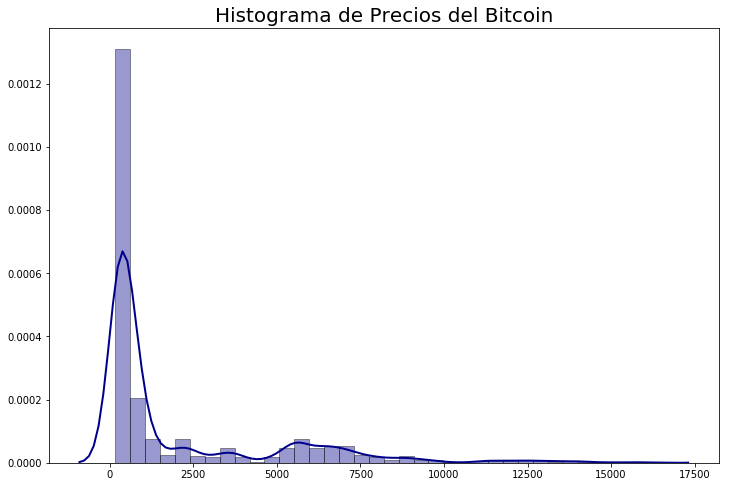

In [31]:
#Construccion de un histograma de los datos
fig = plt.figure(figsize=(12,8))
sns.distplot(mean_price_imp, hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2}).set_title('Histograma de Precios del Bitcoin', fontsize=20)

plt.savefig('14_Hist_Precio_real.png')

#Histograma sesgado a la izquierda

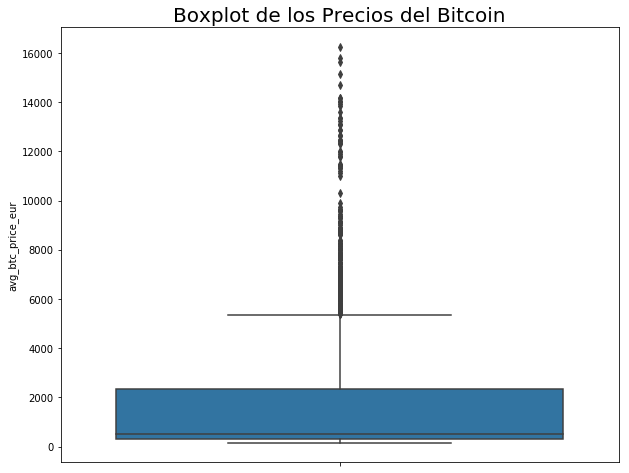

In [32]:
#Construccion de un Diagrama de Cajas y Bigotes Extendidos

fig = plt.figure(figsize=(10,8))
sns.boxplot(y=mean_price_imp['avg_btc_price_eur']).axes.set_title("Boxplot de los Precios del Bitcoin",fontsize=20)

plt.savefig('15_Boxplot_Precio_real.png')


# Análisis de la Serie


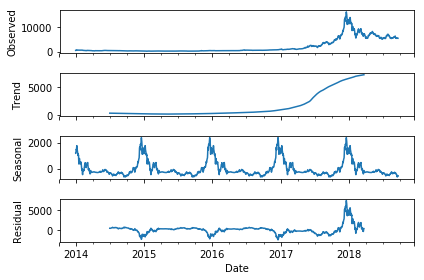

In [33]:
#Prueba asumiendo comportamiento aditivo en la serie
result = seasonal_decompose(mean_price_imp['avg_btc_price_eur'], model='additive',freq=365)
result.plot()

plt.savefig('15_serie_aditiva.png')
pyplot.show()

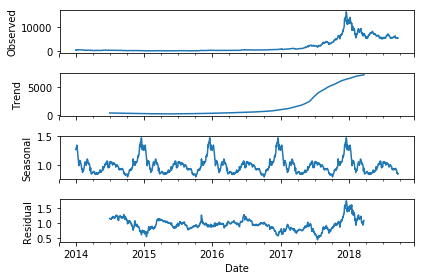

In [34]:
#Prueba asumiendo comportamiento multiplicativo en la serie
result = seasonal_decompose(mean_price_imp['avg_btc_price_eur'], model='multiplicative',freq=365)
result.plot()

plt.savefig('16_serie_multiplicativa.png')
pyplot.show()

Con base en los resultados obtenido se puede observar que la serie es de tipo multiplicativa, asimismo, en el caso aditivo y multiplicativo, se puede observar la componente estacionaria de conducta bimensual. Asimismo, en el caso del comportamiento multiplicativo el residual se reduce a valores que resultan mas logicos y manejables en relacion a su orden de magnitud. Con base en los resultados obtenidos, se procedera a aplicar una transformacion de tipo logaritmica, con la finalidad de linealizar el efecto exponencial que muestran los datos en el grafico de tendencia. 

# Análisis por Parcelas de Línea Temporal

<Figure size 432x288 with 0 Axes>

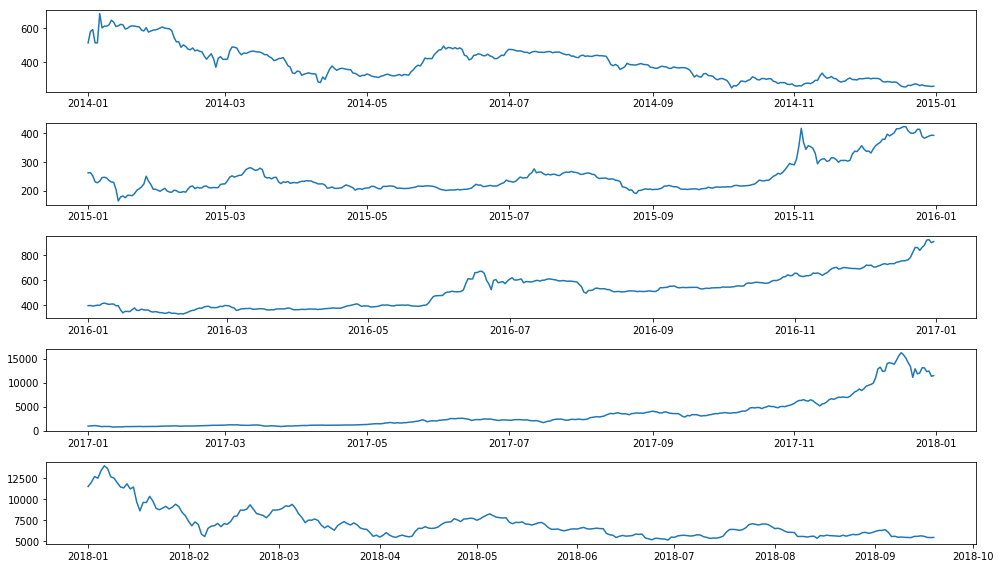

In [35]:
from pandas import Series
from pandas import DataFrame
from pandas import TimeGrouper
from matplotlib import pyplot
groups = mean_price_imp['2014':'2018'].groupby(TimeGrouper('A'))
years = DataFrame()
pyplot.figure()
i = 1
n_groups = len(groups)
fig = plt.figure(figsize=(14,8))
for name, group in groups:
	pyplot.subplot((n_groups*100) + 10 + i)
	i += 1
	pyplot.plot(group)
plt.tight_layout()

plt.savefig('17_Parcela_Temporal.png')
pyplot.show()

Al evaluar los datos se puede observar que los años 2014 y 2018, poseen comportamientos similares, los años 2015 y 2016 muestran el mismo patron creciente incluso con incrementos en los mismos meses, el año 2017 se le asemeja, pero con una conduvta mas suave.  

In [36]:
#Funcion para el calculo de los test de normalidad
from astropy.table import Table
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import seaborn as sns
import pylab 
sns.set(style="darkgrid")
from math import exp, expm1

def normtesttab(x):
    nm_value, nm_p = stats.normaltest(x)
    jb_value, jb_p = stats.jarque_bera(x)
    nm_value =np.round(nm_value, 5)
    nm_p =np.round(nm_p, 5)
    jb_value =np.round(jb_value, 5)
    jb_p =np.round(jb_p, 5)
    data_rows = [('D’Agostino-Pearson', nm_value, nm_p),
                  ('Jarque-Bera', jb_value, jb_p)]
    t = Table(rows=data_rows, names=('Test name', 'Statistic', 'p-value'), 
              meta={'name': 'normal test table'},
          dtype=('S25', 'f8', 'f8'))
    print(t)

In [37]:
#Funcion para el analisis de correlacion para diferentes retrasos
def acf_pacf(serie, retraso):
    plt.figure(figsize=(15,4))
    ax = plt.subplot(211)
    sm.graphics.tsa.plot_acf(serie, lags=retraso, ax=ax)
    ax = plt.subplot(212)
    sm.graphics.tsa.plot_pacf(serie, lags=retraso, ax=ax)
    plt.tight_layout()
    plt.show()

In [38]:
#Transformación de la serie 
#Se aplica Logaritmo base 10 para reducir la varianza de los datos y ajustarlo a un modelo de tipo exponencial, como lo
#indican las teorias econámicas. 

serie_log10 = np.log10(mean_price_imp.avg_btc_price_eur)

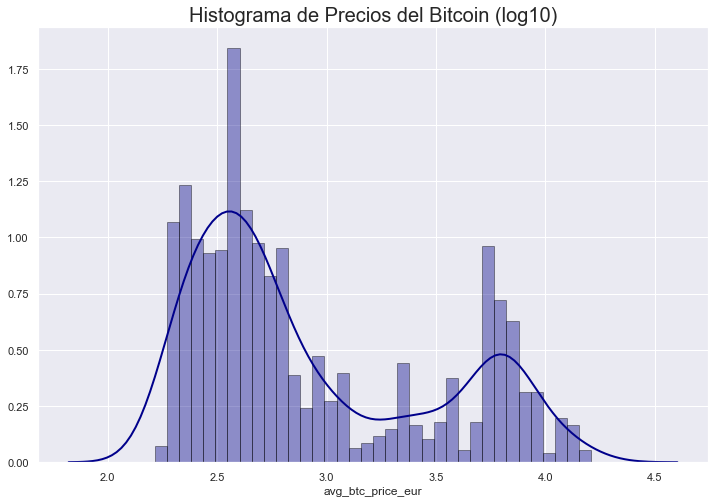

In [39]:
fig = plt.figure(figsize=(12,8))
sns.distplot(serie_log10, hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2}).set_title('Histograma de Precios del Bitcoin (log10)', fontsize=20)

plt.savefig('18_Hist_Log10_imp.png')

In [40]:
#Estadisticos Descriptivos
estadisticos= stats.describe(serie_log10)
print(estadisticos)

DescribeResult(nobs=1723, minmax=(2.214500943552803, 4.210338002229248), mean=2.9235973395891306, variance=0.30193059043805315, skewness=0.7703177650939489, kurtosis=-0.8493389907763147)


In [41]:
summary = serie_log10.describe()
summary = summary.transpose()
summary.head()

count    1723.000000
mean        2.923597
std         0.549482
min         2.214501
25%         2.504347
Name: avg_btc_price_eur, dtype: float64

In [42]:
#Division de los datos en el conjunto de entrenamiento y pruebas
df_train= serie_log10[0:days_look]
x_train = mean_price_imp.index[0:days_look]
data_end=(days_look+days_from_train)
print(data_end)

df_test= serie_log10[len(df_train):data_end]
x_test = mean_price_imp.index[len(df_train):data_end]

#Número de datos de entrenamiento y prueba respectivamente
print(len(df_train), len(df_test)) 

#Último día de la serie
print(x_test[-1]) #En ocasiones el modulo de descarga de datos falla y no los descarga completos


1724
1447 276
2018-09-19 00:00:00


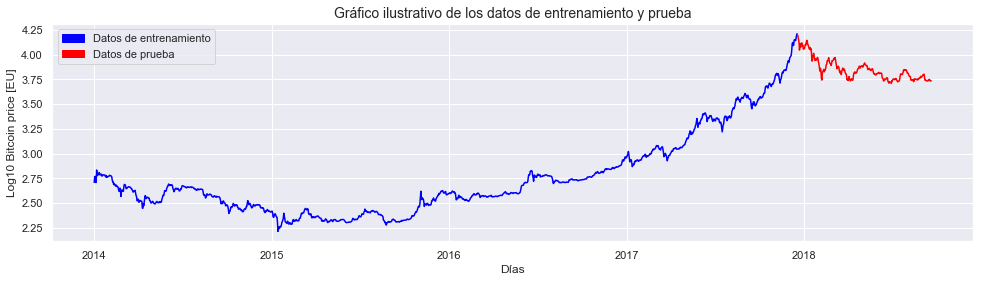

In [43]:
# Grafico de todos los precios del Bitc
import matplotlib.patches as mpatches

plt.figure(figsize=(16.5,4))
pyplot.plot(x_train, df_train, 'blue')
pyplot.plot(x_test, df_test, 'red')
plt.title("Gráfico ilustrativo de los datos de entrenamiento y prueba", fontsize=14)
plt.xlabel('Días')
plt.ylabel('Log10 Bitcoin price [EU]')
plt.grid(True)
red_patch = mpatches.Patch(color='red', label='Datos de prueba')
blue_patch = mpatches.Patch(color='blue', label= 'Datos de entrenamiento')
plt.legend(handles=[blue_patch, red_patch])

plt.savefig('19_trainin&test.png')
pyplot.show()


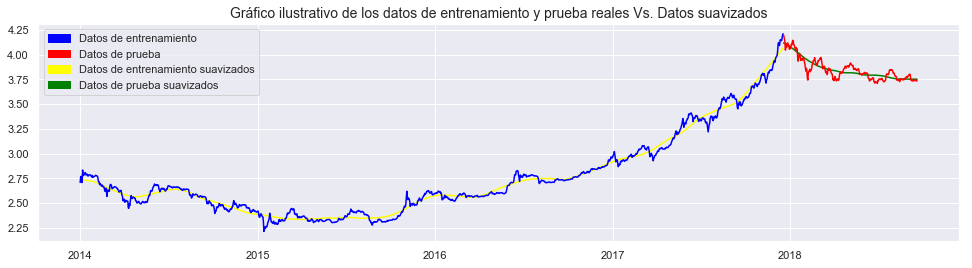

In [44]:
#Filtrado de los datos de entrenamiento y prueba utilizando el filtro de Savitzky Golay

train_smooth = savgol_filter(df_train, 209, 3, mode='nearest')
test_smooth = savgol_filter(df_test, 209, 3, mode='nearest')

plt.figure(figsize=(16.5,4))
pyplot.plot(x_train, train_smooth, 'yellow')
pyplot.plot(x_test, test_smooth, 'green')
pyplot.plot(x_train, df_train, 'blue')
pyplot.plot(x_test, df_test, 'red')
plt.title("Gráfico ilustrativo de los datos de entrenamiento y prueba reales Vs. Datos suavizados", fontsize=14)
red_patch = mpatches.Patch(color='red', label='Datos de prueba')
blue_patch = mpatches.Patch(color='blue', label= 'Datos de entrenamiento')
green_patch = mpatches.Patch(color='green', label='Datos de prueba suavizados')
yellow_patch = mpatches.Patch(color='yellow', label= 'Datos de entrenamiento suavizados')
plt.legend(handles=[blue_patch, red_patch, yellow_patch, green_patch])

plt.savefig('20_smooth_data.png')
pyplot.show()

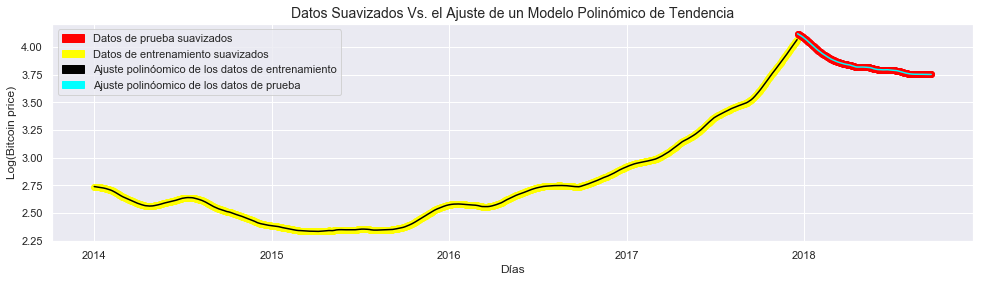

In [45]:
#Ajuste de un polinomio de tendencia
from scipy.interpolate import interp1d
from scipy import interpolate

X = mdates.date2num(x_train)
X = pd.DataFrame({'fecha':X})

poly_2 = interpolate.interp1d(X['fecha'], train_smooth, kind='quadratic')

plt.figure(figsize=(16.5,4))
plt.plot(x_train,train_smooth,'o', color = 'yellow')
plt.plot(x_train, poly_2(X), 'black')

#Datos de prueba
Xp = mdates.date2num(x_test)

poly_2p = interpolate.interp1d(Xp, test_smooth, kind='quadratic')

plt.plot(x_test,test_smooth,'o', color = 'red')
plt.plot(x_test, poly_2p(Xp), 'cyan')
plt.title("Datos Suavizados Vs. el Ajuste de un Modelo Polinómico de Tendencia", fontsize=14)
plt.xlabel('Días')
plt.ylabel('Log(Bitcoin price)')
plt.grid(True)
red_patch = mpatches.Patch(color='red', label='Datos de prueba suavizados')
yellow_patch = mpatches.Patch(color='yellow', label= 'Datos de entrenamiento suavizados')
black_patch = mpatches.Patch(color='black', label='Ajuste polinóomico de los datos de entrenamiento')
cyan_patch = mpatches.Patch(color='cyan', label= 'Ajuste polinóomico de los datos de prueba')
plt.legend(handles=[red_patch , yellow_patch, black_patch, cyan_patch])

plt.savefig('21_polyfit.png')
pyplot.show()

In [46]:
#Analisis estadistico de los datos

fit_train_sm = poly_2(X).reshape((poly_2(X).shape[0],))
fit_test_sm = poly_2p(Xp).reshape((poly_2p(Xp).shape[0],))

#Datos de entrenamiento
media_train = np.mean(df_train.values)
tstudent_train = stats.ttest_1samp(fit_train_sm, media_train, axis = 0 )
print('\033[1m'+ 'Student’s T-Test para los datos de Entrenamiento' +'\033[0m')
print(tstudent_train)

#Datos de Prueba
media_test = np.mean(df_test.values)
tstudent_test = stats.ttest_1samp(fit_test_sm, media_test, axis = 0 )
print('\033[1m'+'Student’s T-Test para los datos de Prueba' +'\033[0m' )
print(tstudent_test)
print(' ')

#Analisis F-Test
print('\033[1m'+ 'F-statistic para los datos de Entrenamiento' +'\033[0m')
f_test_train = stats.f_oneway(df_train.values, fit_train_sm)
print(f_test_train)

print('\033[1m'+ 'F-statistic para los datos de Prueba' +'\033[0m')
f_test_test = stats.f_oneway(df_test.values, fit_test_sm)
print(f_test_test)

Student’s T-Test para los datos de Entrenamiento
Ttest_1sampResult(statistic=0.008821176472617393, pvalue=0.9929630275573106)
Student’s T-Test para los datos de Prueba
Ttest_1sampResult(statistic=0.32180391891349036, pvalue=0.7478457186228642)
 
F-statistic para los datos de Entrenamiento
F_onewayResult(statistic=3.876799208833853e-05, pvalue=0.9950325172822081)
F-statistic para los datos de Prueba
F_onewayResult(statistic=0.04725834641612399, pvalue=0.8279851620451093)


# Remoción de la tendencia de los datos

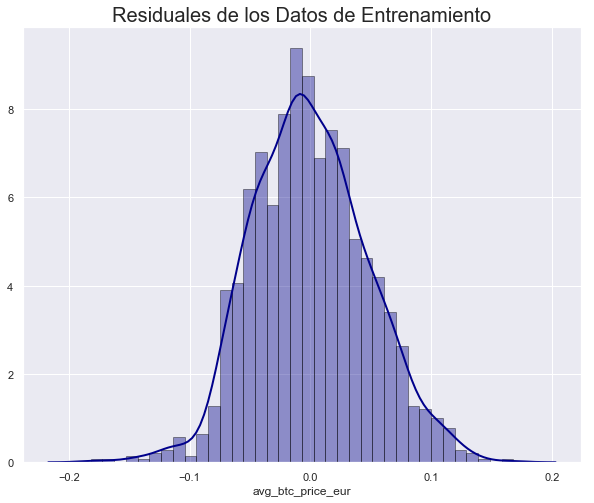

In [47]:
#Transformacion de los datos para que esten en el mismo formato
#X = fit_fxn(X['fecha'])
#Y_mod = Y_mod.reshape((Y_mod.shape[0],))
#Y = Y.reshape((Y.shape[0],))

#Calculo de los residuales
Res_train = df_train - fit_train_sm

Res_test = df_test - fit_test_sm

fig = plt.figure(figsize=(10,8))
sns.distplot(Res_train, hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2}).set_title('Residuales de los Datos de Entrenamiento', fontsize=20)

plt.savefig('22_Res_Train.png')

In [48]:
#Test de Normalidad para los datos de entrenamiento
normtesttab(Res_train)

    Test name      Statistic p-value
------------------ --------- -------
D’Agostino-Pearson   5.85795 0.05345
       Jarque-Bera   5.78635  0.0554


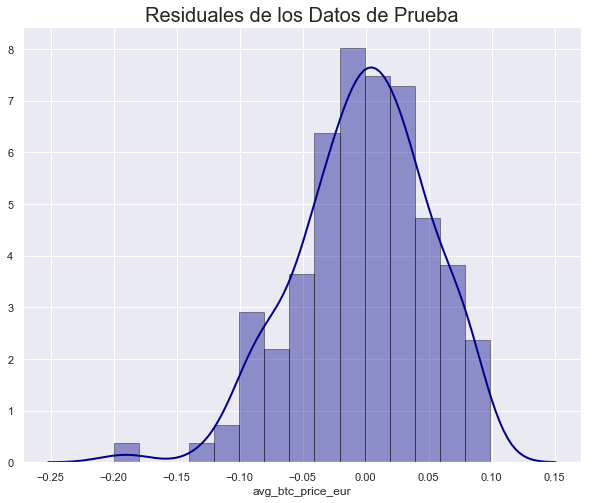

In [49]:
fig = plt.figure(figsize=(10,8))
sns.distplot(Res_test, hist=True, kde=True, 
             color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2}).set_title('Residuales de los Datos de Prueba', fontsize=20)

plt.savefig('23_Res_Test.png')

In [50]:
#Test de Normalidad para los datos de prueba
normtesttab(Res_test)

    Test name      Statistic p-value
------------------ --------- -------
D’Agostino-Pearson  11.97025 0.00252
       Jarque-Bera  12.29481 0.00214


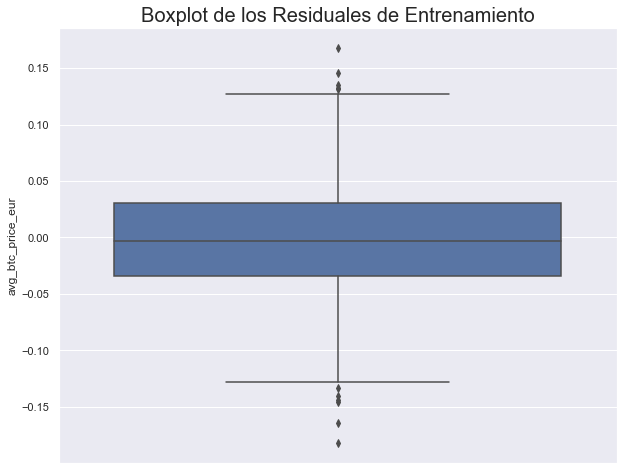

In [51]:
#Construccion de un Diagrama de Cajas y Bigotes Extendidos para los datos residuales
fig = plt.figure(figsize=(10,8))
sns.boxplot(y=Res_train).axes.set_title("Boxplot de los Residuales de Entrenamiento",fontsize=20)

plt.savefig('24_Boxplot_Res_Train.png')

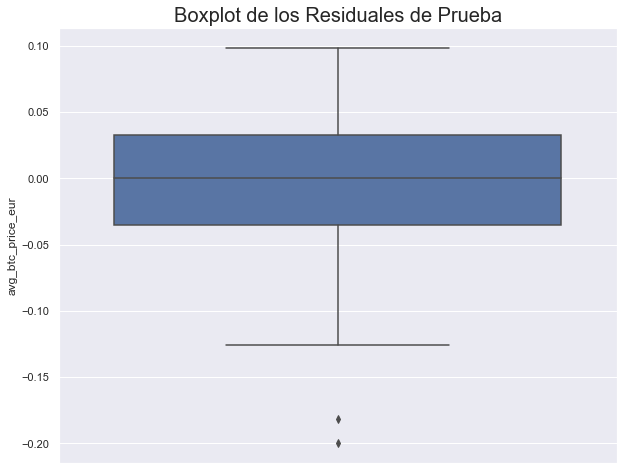

In [52]:
#Construccion de un Diagrama de Cajas y Bigotes Extendidos para los datos residuales
fig = plt.figure(figsize=(10,8))
sns.boxplot(y=Res_test).axes.set_title("Boxplot de los Residuales de Prueba",fontsize=20)

plt.savefig('25_Boxplot_Res_Test.png')

In [53]:
#Funcion para la construcción de probability plots
def graficos_pp(res_train1, res_test1):
    fig = plt.figure(figsize=(10,8))
    ax1 = fig.add_subplot(211)
    stats.probplot(res_train1, dist=stats.norm, plot=ax1)
    ax1.set_xlabel('')
    ax1.set_title('Probplot Vs. distribución normal (entrenamiento)', fontsize=20)

    ax2 = fig.add_subplot(212)
    stats.probplot(res_test1, dist=stats.norm, plot=ax2)
    ax2.set_title('Probplot Vs. distribución normal (prueba)', fontsize=20)
    plt.tight_layout()
    pyplot.show()    

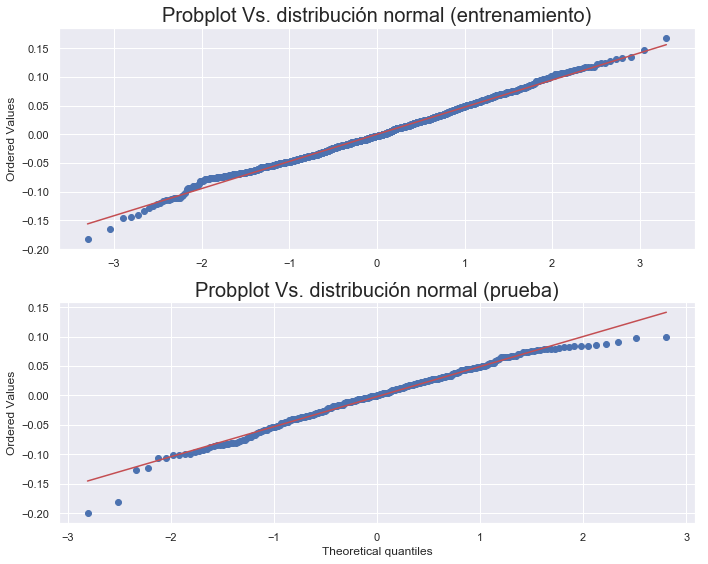

In [54]:
#Graficos de probabilidad para los datos de entrenamiento y prueba
graficos_pp(Res_train, Res_test)

In [55]:
#Funcion para aplicar la Prueba aumentada Dickey-Fuller
from statsmodels.tsa.stattools import adfuller

def test_df(serie_residual):
    result = adfuller(serie_residual)
    print('Dickey-Fuller Statistic: %f' % result[0])
    print('\033[1m'+ 'p-value: %f' % result[1] +'\033[0m')
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

In [56]:
test_df(Res_train)

Dickey-Fuller Statistic: -5.911927
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


In [57]:
test_df(Res_test)

Dickey-Fuller Statistic: -3.402320
p-value: 0.010880
Critical Values:
	1%: -3.455
	5%: -2.872
	10%: -2.573


En el caso de los datos de prueba el Test Aumentado de Dickey-Fuller indica que existe estacionalidad en los datos, lo que se sustenta en el hecho de que solo se removio la señal de mayor longitud de onda, por ello, será necesario remover las freuencias de longitud intermedia y corta. 

# Análisis de Periodicidad de la Serie mediante *FFT*

El análisis de periodicidad en los datos se debe realizar sobre los datos residuales, por lo cual sera necesario concatenar los datos residuales para evaluar la serie completa. 

15    114.866667
16    107.687500
17    101.352941
14    123.071429
10    172.300000
9     191.444444
20     86.150000
18     95.722222
21     82.047619
19     90.684211
Name: Fq, dtype: float64


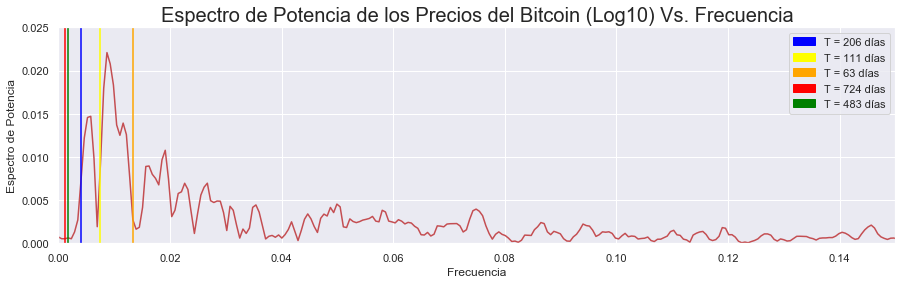

In [58]:
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib.pyplot import *
from numpy import inf

residual_tt = np.concatenate((Res_train, Res_test), axis=0)
y=residual_tt
fs = 1

f, amp = signal.periodogram(y, fs,'flattop', scaling='spectrum',return_onesided = True)

tabla = pd.DataFrame({'Amp':amp, 'Fq': f})
tabla2 =tabla.sort_values('Amp', ascending=False)

#Cálculo del periodo (T=1/f)
freq = 1/tabla2.Fq
freq[freq == inf] = 0
print(freq.head(n=10))

plt.figure(1, figsize=(15,5))
plot(f, np.sqrt(amp),'r-')
plt.axis([0, 0.15, 0, 0.025])
plt.xlabel('Frecuencia')
plt.ylabel('Espectro de Potencia')
plt.grid(True)
plt.title('Espectro de Potencia de los Precios del Bitcoin (Log10) Vs. Frecuencia', fontsize=20)
plt.subplots_adjust(bottom=0.15, top=0.75)
#Segmentos rectos en valores claves de frecuencia
plt.axvline(x=1/freq[7], color = 'blue')
plt.axvline(x=1/freq[13], color = 'yellow')
plt.axvline(x=1/freq[23], color = 'orange')
plt.axvline(x=1/freq[2], color = 'red')
plt.axvline(x=1/freq[3], color = 'green')
plt.draw()
blue_patch = mpatches.Patch(color='blue', label='T = 206 días')
yellow_patch = mpatches.Patch(color='yellow', label='T = 111 días')
orange_patch = mpatches.Patch(color='orange', label='T = 63 días')
red_patch = mpatches.Patch(color='red', label='T = 724 días')
green_patch = mpatches.Patch(color='green', label='T = 483 días')
plt.legend(handles=[blue_patch, yellow_patch, orange_patch, red_patch, green_patch])

#Respaldo de la imágen
plt.savefig('27_Esp_Pot.png')
plt.show()

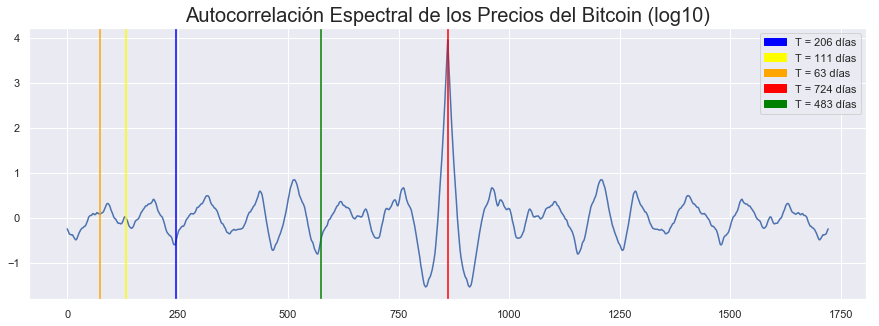

In [59]:
#Analisis se señales para detectar periodicidad (Utilizar para los residuales)

corr = signal.correlate(residual_tt, residual_tt, mode='same') 
plt.figure(1, figsize=(15,5))
plot(corr)
plt.title('Autocorrelación Espectral de los Precios del Bitcoin (log10)', fontsize=20)
plt.axvline(x=freq[7], color = 'blue')
plt.axvline(x=freq[13], color = 'yellow')
plt.axvline(x=freq[23], color = 'orange')
plt.axvline(x=freq[2], color = 'red')
plt.axvline(x=freq[3], color = 'green')
blue_patch = mpatches.Patch(color='blue', label='T = 206 días')
yellow_patch = mpatches.Patch(color='yellow', label='T = 111 días')
orange_patch = mpatches.Patch(color='orange', label='T = 63 días')
red_patch = mpatches.Patch(color='red', label='T = 724 días')
green_patch = mpatches.Patch(color='green', label='T = 483 días')
plt.legend(handles=[blue_patch, yellow_patch, orange_patch, red_patch, green_patch])
plot()
plt.savefig('28_Autocorre_Serie.png')
plt.show()

## Remoción de la Estacionalidad (frecuencia de 724 días)

Con base en lo observado en el analisis de descomposicion espectral, cada 2 años se repite el comportamiento de la curva, al evaluar la descomposicion de los datos en sus componentes de tendencia,  estacionalidad y residuales, se puede apreciar el patron descrito por el analisis de fourier. 

In [60]:
#Funcion para realizar la remocion de la estacionalidad
def descomponer(serie, frecuencia):
    decomposition = seasonal_decompose(serie,freq=frecuencia)
    fig = plt.figure()
    fig = decomposition.plot()
    fig.set_size_inches(15, 8)
    #Extraccion de las componentes
    seasonal = decomposition.seasonal
#Remocion de la componente estacional
#Division de los datos en el conjunto de entrenamiento
    seasonal_train= seasonal[0:days_look]
    seasonal_test= seasonal[len(df_train):data_end]
    return [seasonal_train, seasonal_test]

In [61]:
#Funcion para realizar el calculo de los residuales
def res_calc(serie_train, season_train, serie_test, season_test):
    res_train = serie_train - season_train
    res_test = serie_test - season_test
    return [res_train, res_test]

In [62]:
#Funcion para la construccion de los graficos residuales
def graficos_res(x_train,y_train, x_test, y_test, frecuencia):
    plt.figure(1, figsize=(15,5))
    fig11=plt.plot(x_train,y_train, 'blue')
    fig12=plt.plot(x_test, y_test, 'red')
    plt.title("Residuales de la remoción de una frecuencia de " + frecuencia + ' días', fontsize=20)
    plt.xlabel('Fecha(Días)')
    plt.ylabel('Estacionalidad')
    plt.grid(True)
    red_patch = mpatches.Patch(color='red', label='Res. Test')
    blue_patch = mpatches.Patch(color='blue', label='Res. Train')
    plt.legend(handles=[blue_patch, red_patch])
    pyplot.show()

## Remoción de estacionalidad para 724 días

1447 276


<Figure size 432x288 with 0 Axes>

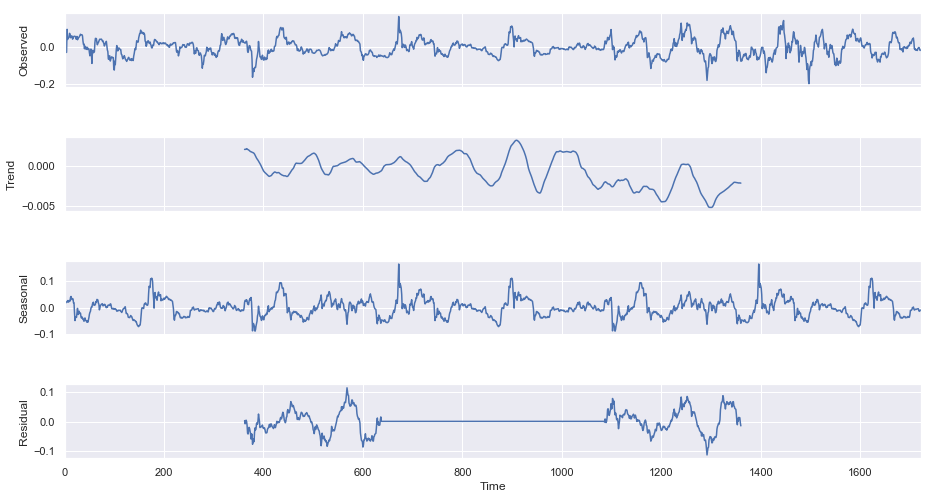

In [63]:
#Remocion de estacionalidad para una frecuencia de 724 dias

#Concatenacion de los datos de Entrenamiento y Prueba
residual_1 = np.concatenate((Res_train, Res_test), axis=0)

season_train_724, season_test_724 = descomponer(residual_1,724) 
print(len(season_train_724), len(season_test_724 ))

In [64]:
#Calculo de residuales para una estacionalidad de 724 días
res_train_724, res_test_724 = res_calc(Res_train, season_train_724, Res_test, season_test_724)

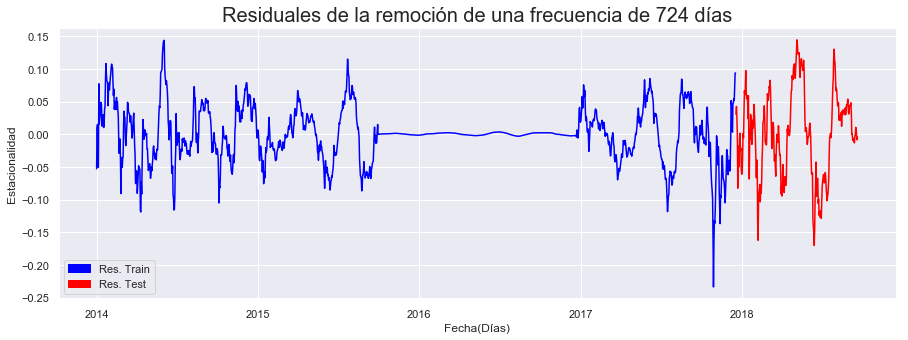

In [65]:
#Grafico de Residuales luego de remover 724 dias
graficos_res(x_train,res_train_724, x_test,res_test_724, '724')


In [66]:
#Test de Normalidad para los resisuales de entrenamiento
normtesttab(res_train_724)

    Test name      Statistic p-value
------------------ --------- -------
D’Agostino-Pearson  79.90669     0.0
       Jarque-Bera 242.08771     0.0


In [67]:
#Test de Normalidad para los resisuales de prueba
normtesttab(res_test_724)

    Test name      Statistic p-value
------------------ --------- -------
D’Agostino-Pearson   5.50158 0.06388
       Jarque-Bera   3.74707 0.15358


In [68]:
#Test de Dicky-Fuller para los residuales de entrenamiento
test_df(res_train_724)

Dickey-Fuller Statistic: -6.918855
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


In [69]:
#Test de Dicky-Fuller para los residuales de prueba
test_df(res_test_724)

Dickey-Fuller Statistic: -3.144234
p-value: 0.023448
Critical Values:
	1%: -3.455
	5%: -2.872
	10%: -2.572


El test aumentado de Dickey-Fuller indica que los datos de entrenamiento prueba preservan la componente de estacionalidad, por lo cual se debe continuar con el proceso de remoción. 

## Remoción de la Estacionalidad (frecuencia de 206 días)

<Figure size 432x288 with 0 Axes>

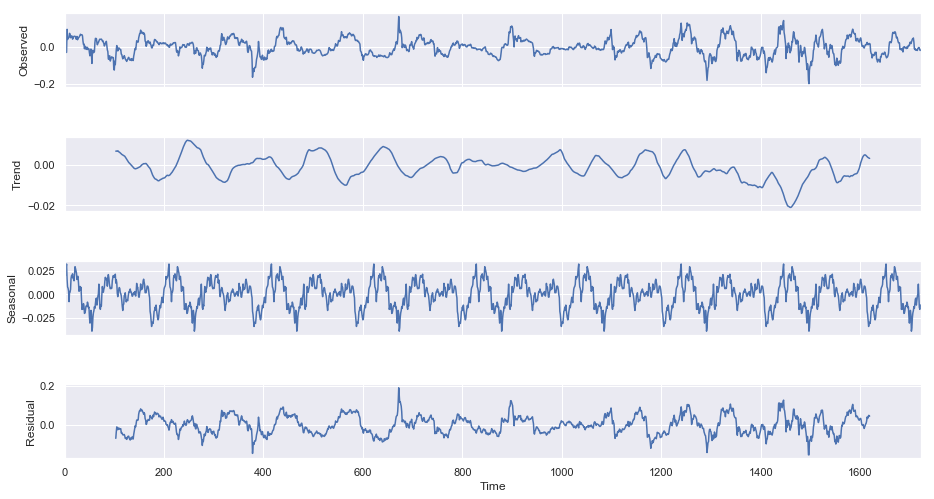

In [70]:
season_train_724_206, season_test_724_206 = descomponer(residual_1,206)

In [71]:
#Calculo de residuales para una estacionalidad de 206 días
res_train_724_206, res_test_724_206 = res_calc(res_train_724, season_train_724_206, res_test_724, season_test_724_206)

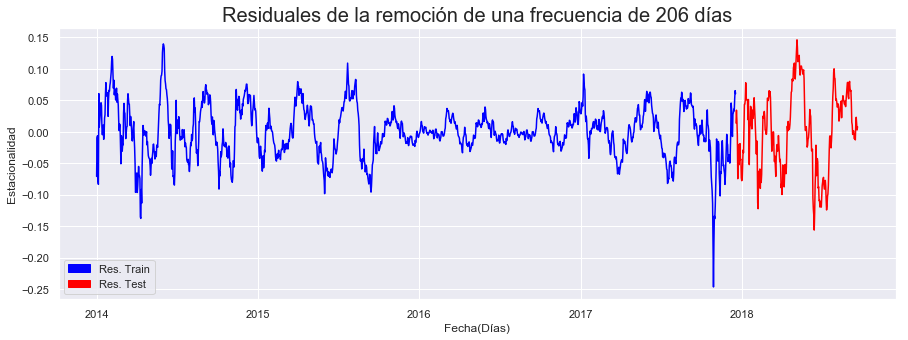

In [72]:
#Grafico de Residuales luego de remover 206 dias
graficos_res(x_train,res_train_724_206, x_test,res_test_724_206, '206')

In [73]:
#Test de Normalidad para los resisuales de entrenamiento
normtesttab(res_train_724_206)

    Test name      Statistic p-value
------------------ --------- -------
D’Agostino-Pearson  81.12051     0.0
       Jarque-Bera 220.05344     0.0


In [74]:
#Test de Normalidad para los resisuales de prueba
normtesttab(res_test_724_206)

    Test name      Statistic p-value
------------------ --------- -------
D’Agostino-Pearson  14.13068 0.00085
       Jarque-Bera   6.59256 0.03702


In [75]:
#Test de Dicky-Fuller para los residuales de entrenamiento
test_df(res_train_724_206)

Dickey-Fuller Statistic: -6.911434
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


In [76]:
#Test de Dicky-Fuller para los residuales de prueba
test_df(res_test_724_206)

Dickey-Fuller Statistic: -3.090768
p-value: 0.027244
Critical Values:
	1%: -3.455
	5%: -2.872
	10%: -2.572


# Remoción de la Estacionalidad (frecuencia de 111 días)

<Figure size 432x288 with 0 Axes>

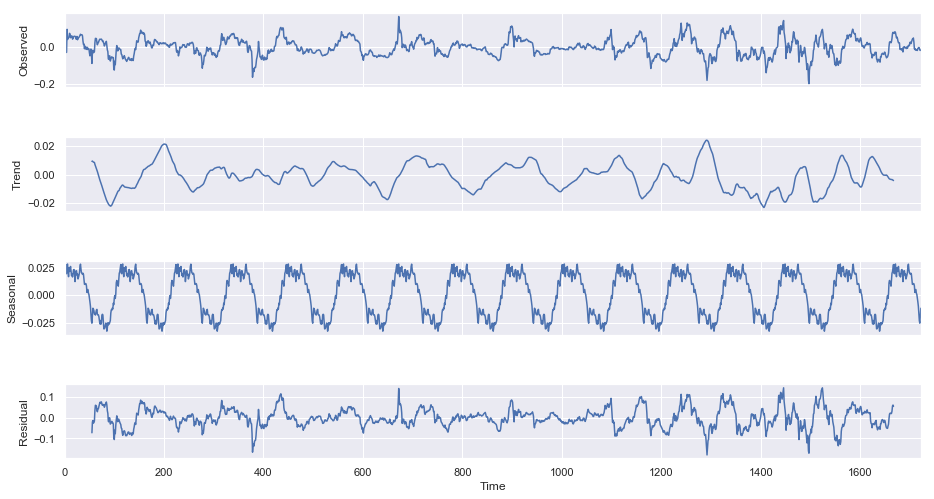

In [77]:
season_train_724_206_111, season_test_724_206_111 = descomponer(residual_1,111)

In [78]:
#Calculo de residuales para una estacionalidad de 111 días
res_train_724_206_111, res_test_724_206_111 = res_calc(res_train_724_206, season_train_724_206_111, res_test_724_206, season_test_724_206_111)

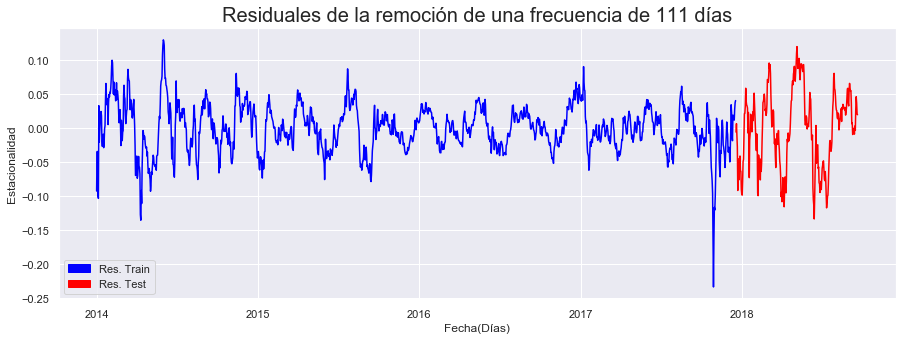

In [79]:
#Grafico de Residuales luego de remover 210 dias
graficos_res(x_train,res_train_724_206_111, x_test,res_test_724_206_111, '111')

In [80]:
#Test de Dicky-Fuller para los residuales de entrenamiento
test_df(res_train_724_206_111)

Dickey-Fuller Statistic: -7.183294
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


In [81]:
#Test de Dicky-Fuller para los residuales de prueba
test_df(res_test_724_206_111)

Dickey-Fuller Statistic: -3.382925
p-value: 0.011555
Critical Values:
	1%: -3.455
	5%: -2.872
	10%: -2.572


# Análisis de la estacionalidad (frecuencia 63 días)

<Figure size 432x288 with 0 Axes>

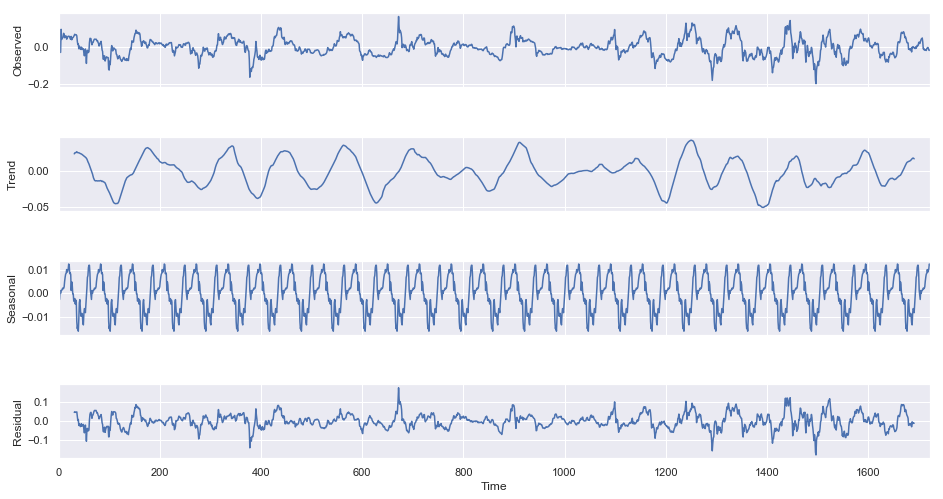

In [82]:
#Análisis de estacionariedad para 163 días (5.4 meses)
season_train_724_206_111_63, season_test_724_206_111_63 = descomponer(residual_1,63)

In [83]:
#Calculo de residuales para una estacionalidad de 163 días
season_train = season_train_724_206_111_63
season_test = season_test_724_206_111_63
res_train = res_train_724_206_111
res_test = res_test_724_206_111
res_train_724_206_111_63, res_test_724_206_111_63 = res_calc(res_train, season_train, res_test, season_test)

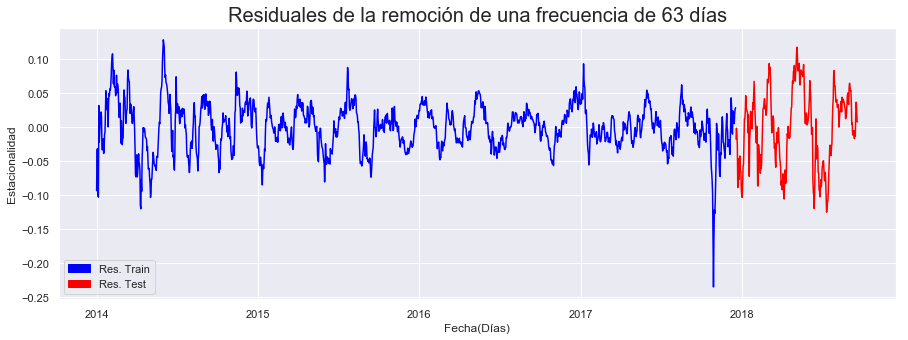

In [84]:
#Grafico de Residuales luego de remover 163 dias
graficos_res(x_train,res_train_724_206_111_63, x_test,res_test_724_206_111_63, '63')

In [85]:
#Test de Dicky-Fuller para los residuales de entrenamiento
test_df(res_train_724_206_111_63)

Dickey-Fuller Statistic: -7.219573
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


In [86]:
#Test de Dicky-Fuller para los residuales de prueba
test_df(res_test_724_206_111_63)

Dickey-Fuller Statistic: -3.402014
p-value: 0.010890
Critical Values:
	1%: -3.455
	5%: -2.872
	10%: -2.572


## Remoción de la Estacionalidad (frecuencia 483 días)

<Figure size 432x288 with 0 Axes>

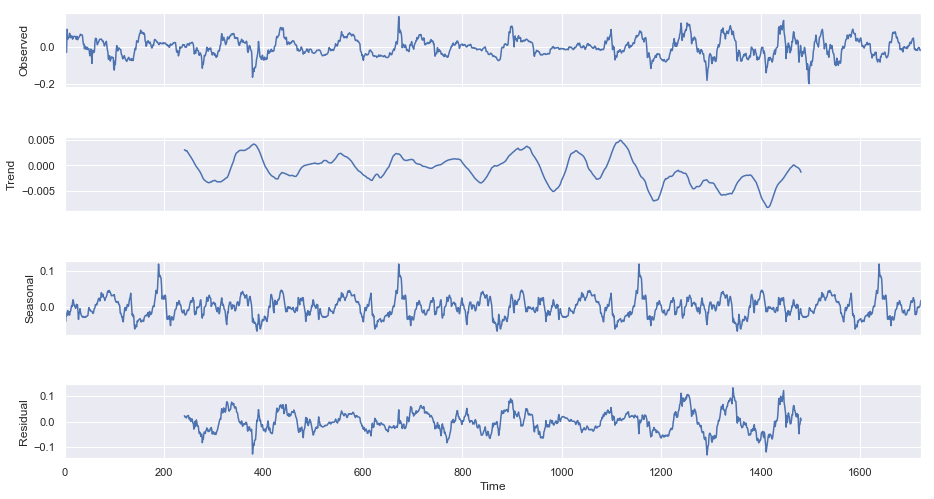

In [87]:
#Analisis de estacionariedad para 489 dias (16 meses)
season_train_724_206_111_63_483, season_test_724_206_111_63_483 = descomponer(residual_1,483)

In [88]:
#Calculo de residuales para una estacionalidad de 483 días
season_train = season_train_724_206_111_63_483
season_test = season_test_724_206_111_63_483
res_train = res_train_724_206_111_63
res_test = res_test_724_206_111_63
res_train_724_206_111_63_483, res_test_724_206_111_63_483 = res_calc(res_train, season_train, res_test, season_test)

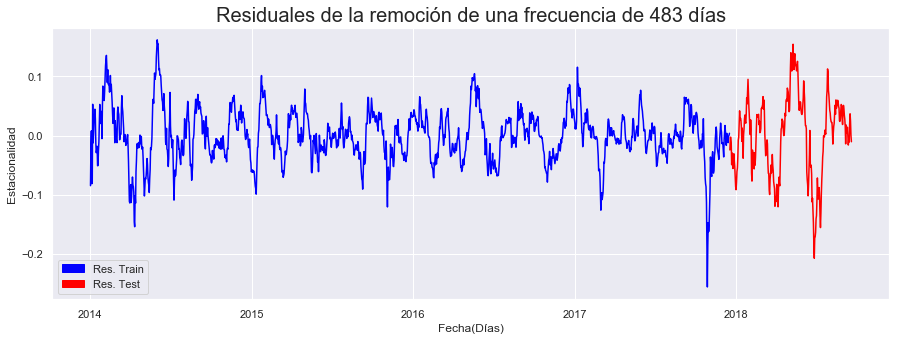

In [89]:
#Grafico de Residuales luego de remover 483 dias
graficos_res(x_train,res_train_724_206_111_63_483, x_test,res_test_724_206_111_63_483, '483')

In [90]:
#Test de Dicky-Fuller para los residuales de entrenamiento
test_df(res_train_724_206_111_63_483)

Dickey-Fuller Statistic: -7.094315
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


In [91]:
#Test de Dicky-Fuller para los residuales de prueba
test_df(res_test_724_206_111_63_483)

Dickey-Fuller Statistic: -2.905223
p-value: 0.044744
Critical Values:
	1%: -3.454
	5%: -2.872
	10%: -2.572


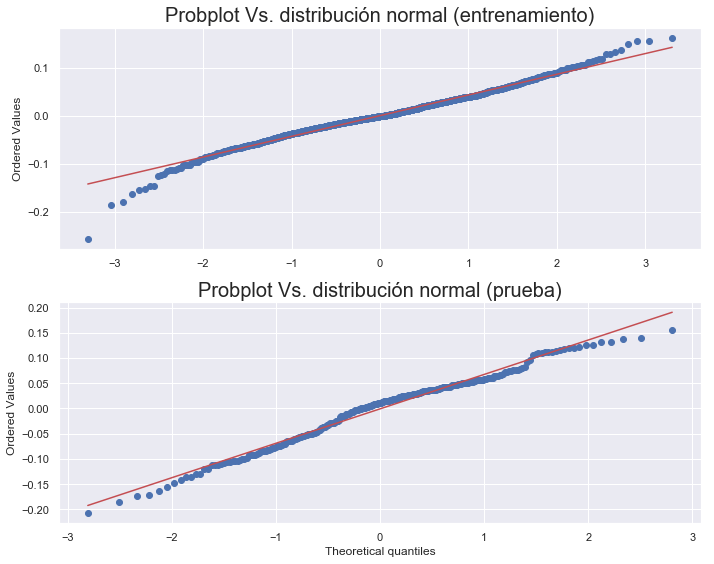

In [92]:
graficos_pp(res_train_724_206_111_63_483, res_test_724_206_111_63_483)

# Diferenciación de la Serie

In [93]:
#Diferenciación de los datos de entrenamiento
res_train_724_206_111_63_483_diff = np.diff(res_train_724_206_111_63_483, n=1)

#Diferenciación de los datos de prueba
res_test_724_206_111_63_483_diff = np.diff(res_test_724_206_111_63_483, n=1)

In [94]:
#Test de Dicky-Fuller para los residuales de entrenamiento
test_df(res_train_724_206_111_63_483_diff)

Dickey-Fuller Statistic: -9.909567
p-value: 0.000000
Critical Values:
	1%: -3.435
	5%: -2.864
	10%: -2.568


In [95]:
#Test de Dicky-Fuller para los residuales de prueba
test_df(res_test_724_206_111_63_483_diff)

Dickey-Fuller Statistic: -13.621319
p-value: 0.000000
Critical Values:
	1%: -3.454
	5%: -2.872
	10%: -2.572


Luego de realizar la diferenciacion, se logra remover la estacionalidad 

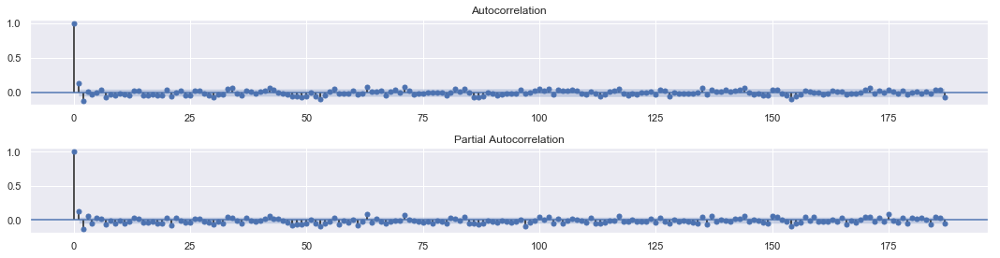

In [96]:
#Analisis para 187 dias
acf_pacf(res_train_724_206_111_63_483_diff, 187)

# Ajuste del Modelo Arima
These parameters are labeled p,d,and q:

    *p* is the parameter associated with the auto-regressive aspect of the model
    *d* is the parameter associated with the integrated part of the model, which effects the amount of differencing to apply to a time series
    *q* is the parameter associated with the moving average part of the model

In [97]:
#Ajuste del modelo Arima
from statsmodels.tsa.arima_model import ARIMA

model = ARIMA(res_train_724_206_111_63_483, order=(2,1,0))
model_fit = model.fit(disp=0)
# print summary of fit model
print(model_fit.summary())

                              ARIMA Model Results                              
Dep. Variable:     D.avg_btc_price_eur   No. Observations:                 1446
Model:                  ARIMA(2, 1, 0)   Log Likelihood                4024.967
Method:                        css-mle   S.D. of innovations              0.015
Date:                 Thu, 20 Sep 2018   AIC                          -8041.935
Time:                         16:31:13   BIC                          -8020.829
Sample:                     01-02-2014   HQIC                         -8034.058
                          - 12-17-2017                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                      5.926e-05      0.000      0.149      0.882      -0.001       0.001
ar.L1.D.avg_btc_price_eur     0.1484      0.026      5.664      0.000       0.

# Forecasting

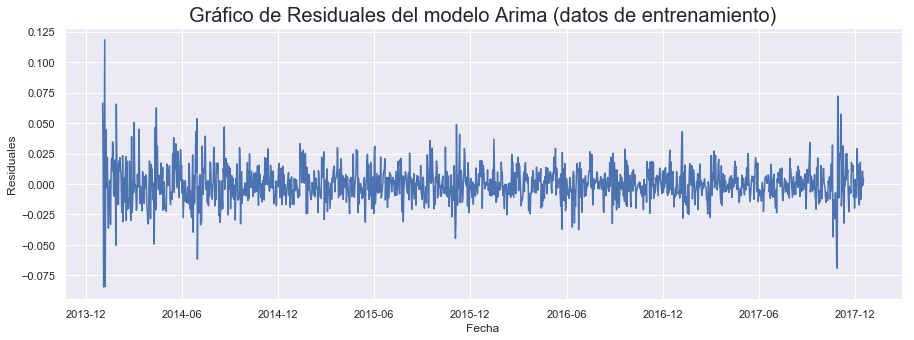

In [98]:
# Gráficos de residuales del Modelo Arima
forecast = model_fit.forecast()[0]
residuals = DataFrame(model_fit.resid)

plt.figure(1, figsize=(15,5))
plot(residuals)
plt.grid(True)
plt.title('Gráfico de Residuales del modelo Arima (datos de entrenamiento)', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Residuales')
plt.savefig('40_Arima_Res_Training.png')

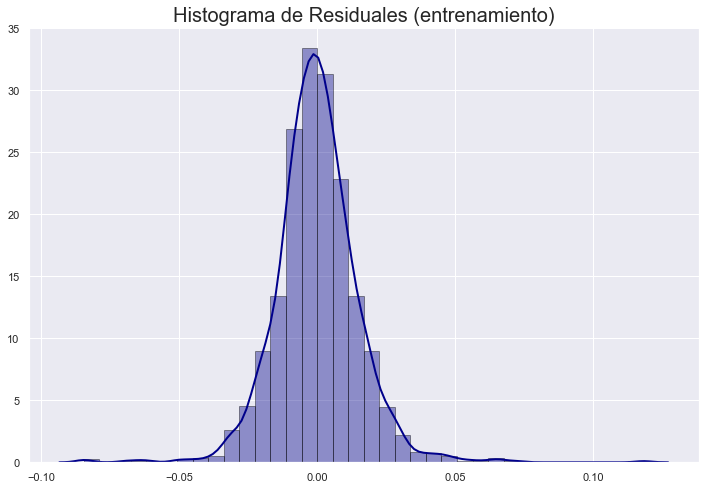

In [99]:
train_residual = residuals

fig = plt.figure(figsize=(12,8))
sns.distplot(train_residual, hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2}).set_title('Histograma de Residuales (entrenamiento)', fontsize=20)

plt.savefig('41_Hist_Arima_Res_Training.png')

In [100]:
#Cálculo de errores del modelo arima
error_rms_train= np.sqrt(((train_residual) ** 2).mean())
print('Test MSE: %.3f' % error_rms_train)

Test MSE: 0.015


In [101]:
#Aplicación de los test de normalidad a los datos residuales
normtesttab(residuals)

    Test name      Statistic  p-value
------------------ ---------- -------
D’Agostino-Pearson   209.6355     0.0
       Jarque-Bera 1998.84119     0.0


# Predicciones con ARIMA

In [102]:
#Funcion para realizar predicciones con Arima utilizando los datos de entrenamiento y prueba

def p_arima(train, test):
    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(2,1,0))
        model_fit = model.fit(disp=0)
        output = model_fit.forecast()
        yhat1 = output[0]
        predictions.append(yhat1)
        obs = test[t]
        history.append(obs)
    return(predictions)

In [103]:
#Prediccion y analisis de errores con Arima (datos test)
#La diferenciacion se incluye dentro del modelo
predic_test= p_arima(res_train_724_206_111_63_483, res_test_724_206_111_63_483)

Test MSE: 0.005


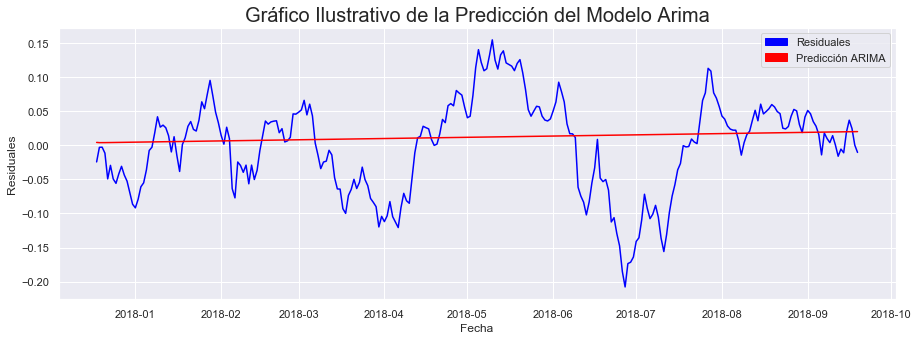

Error MAE del Modelo: 0.053


In [104]:
#Predicción con el modlo Arima de los datos de prueba
from sklearn.metrics import mean_absolute_error

arima_test = ARIMA(res_train_724_206_111_63_483, order=(2,1,0)).fit()

predic_test = arima_test.forecast(len(res_test_724_206_111_63_483))

error = mean_squared_error(res_test_724_206_111_63_483, predic_test[0])
print('Test MSE: %.3f' % error)

# Gráfico de los resultados
plt.figure(1, figsize=(15,5))
pyplot.plot(x_test, res_test_724_206_111_63_483, color = 'blue')
pyplot.plot(x_test, predic_test[0], color='red')
plt.title('Gráfico Ilustrativo de la Predicción del Modelo Arima', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Residuales')
red_patch = mpatches.Patch(color='red', label='Predicción ARIMA')
blue_patch = mpatches.Patch(color='blue', label='Residuales')
plt.legend(handles=[blue_patch, red_patch])

plt.savefig('42_Predicion_Arima_Res_Test.png')
pyplot.show()

#predic_test  = np.array(predic_test)
#predic_test  = predic_test.reshape((predic_test.shape[0],))

residual_testing = res_test_724_206_111_63_483 - predic_test[0]

MAE_error = mean_absolute_error(res_test_724_206_111_63_483, predic_test[0])
print('Error MAE del Modelo: %.3f' % MAE_error)

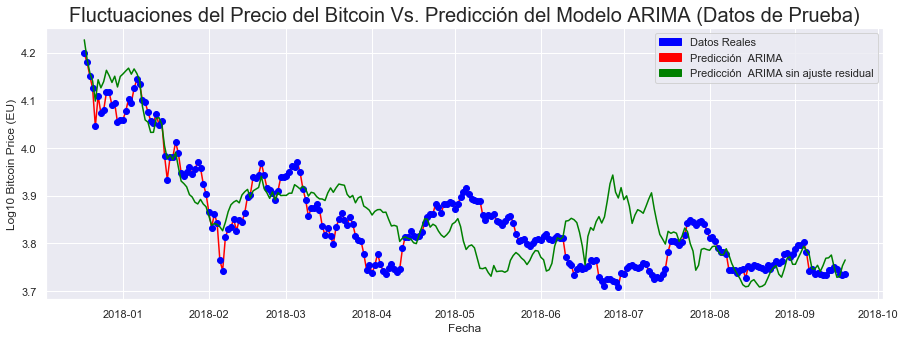

Test MSE: 1128.953
Error MAE del Modelo: 880.225


In [105]:
#Reconstruccion de la Serie de prueba
fit_train_sm = poly_2(X).reshape((poly_2(X).shape[0],))
fit_test_sm = poly_2p(Xp).reshape((poly_2p(Xp).shape[0],))

predic_testing = predic_test[0] + residual_testing.values  + season_test_724_206_111_63_483 + season_test_724_206_111_63 + season_test_724_206_111 + season_test_724_206 + season_test_724 + fit_test_sm
predic_testing_sin_ajuste_res = predic_test[0] + season_test_724_206_111_63_483 + season_test_724_206_111_63 + season_test_724_206_111 + season_test_724_206 + season_test_724 + fit_test_sm

#Se devuelven los cambios mediante la aplicacion de una funcion de potencia base 10
predic_test_2 =  10**predic_testing
predic_test_3 =  10**predic_testing_sin_ajuste_res

plt.figure(1, figsize=(15,5))
pyplot.plot(x_test, predic_testing, color='red')
pyplot.plot(x_test, df_test, 'o', color = 'blue')
pyplot.plot(x_test, predic_testing_sin_ajuste_res, color='green')

plt.title('Fluctuaciones del Precio del Bitcoin Vs. Predicción del Modelo ARIMA (Datos de Prueba)', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Log10 Bitcoin Price (EU)')
red_patch = mpatches.Patch(color='red', label='Predicción  ARIMA')
green_patch = mpatches.Patch(color='green', label= 'Predicción  ARIMA sin ajuste residual')
blue_patch = mpatches.Patch(color='blue', label='Datos Reales')

plt.legend(handles=[blue_patch, red_patch, green_patch])

plt.savefig('43_Predicion_Arima_Test_log10.png')
pyplot.show()

#error = mean_squared_error(10**df_test, 10**predic_testing_sin_ajuste_res)
delta = (10**df_test-10**predic_testing_sin_ajuste_res)
delta_sq = delta**2
suma_delta = sum(delta_sq)/len(delta_sq)
error = suma_delta**0.5
print('Test MSE: %.3f' % error)

MAE_error = mean_absolute_error(10**df_test, 10**predic_testing_sin_ajuste_res)
print('Error MAE del Modelo: %.3f' % MAE_error)

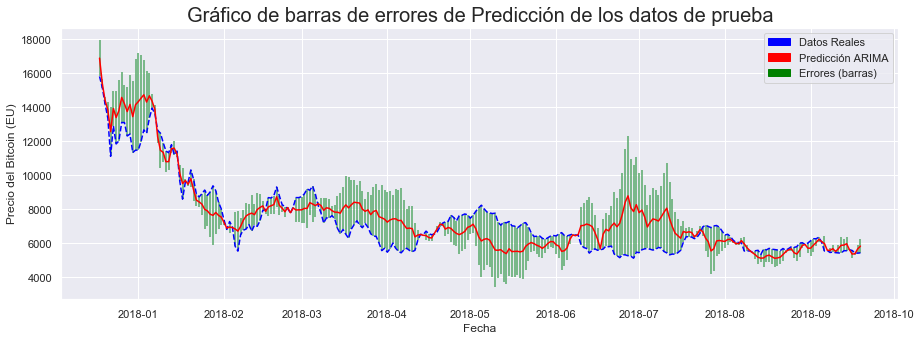

In [106]:
error_diario = 10**df_test - 10**predic_testing_sin_ajuste_res
#Gráfico de errores
plt.figure(1, figsize=(15,5))
plt.errorbar(x_test, 10**predic_testing_sin_ajuste_res, yerr=error_diario, color='red', fmt='-', ecolor='g')
pyplot.plot(x_test, 10**df_test, '--', color = 'blue')
plt.title('Gráfico de barras de errores de Predicción de los datos de prueba', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Precio del Bitcoin (EU)')
red_patch = mpatches.Patch(color='red', label='Predicción ARIMA')
green_patch = mpatches.Patch(color='green', label= 'Errores (barras)')
blue_patch = mpatches.Patch(color='blue', label='Datos Reales')

plt.legend(handles=[blue_patch, red_patch, green_patch])
plt.savefig('43b_Errores_Predicion_Arima_Test_EUR.png')
plt.show()

predict_Ar = [10**predic_testing_sin_ajuste_res, 10**df_test]

np.savetxt('Predic_Arima_Test.txt', predict_Ar, delimiter=',')  

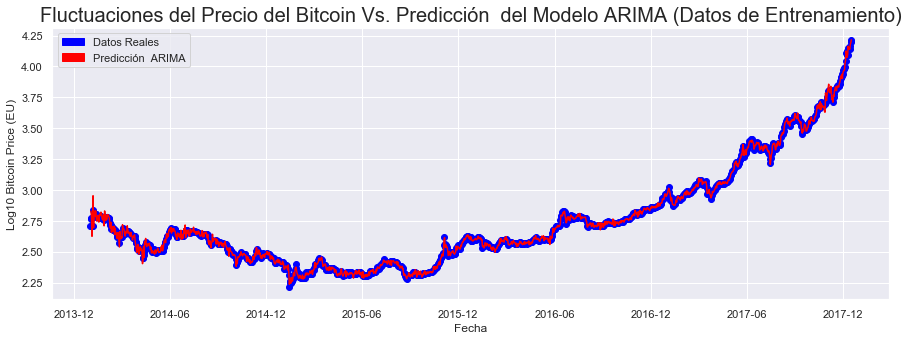

In [107]:
#Reconstrucción de los datos de entrenamiento

train_ajustada = res_train_724_206_111_63_483 + train_residual[0] + season_train_724_206_111_63_483 + season_train_724_206_111_63 + season_train_724_206_111 + season_train_724_206 + season_train_724 + fit_train_sm

plt.figure(figsize=(15,5))
pyplot.plot(x_train, df_train, 'o', color ='blue')
pyplot.plot(x_train, train_ajustada, color='red')
plt.title('Fluctuaciones del Precio del Bitcoin Vs. Predicción  del Modelo ARIMA (Datos de Entrenamiento)', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Log10 Bitcoin Price (EU)')
red_patch = mpatches.Patch(color='red', label='Predicción  ARIMA')
blue_patch = mpatches.Patch(color='blue', label='Datos Reales')
plt.legend(handles=[blue_patch, red_patch])

plt.savefig('44_Predicion_Arima_Training_log10.png')
pyplot.show()   


<Figure size 432x288 with 0 Axes>

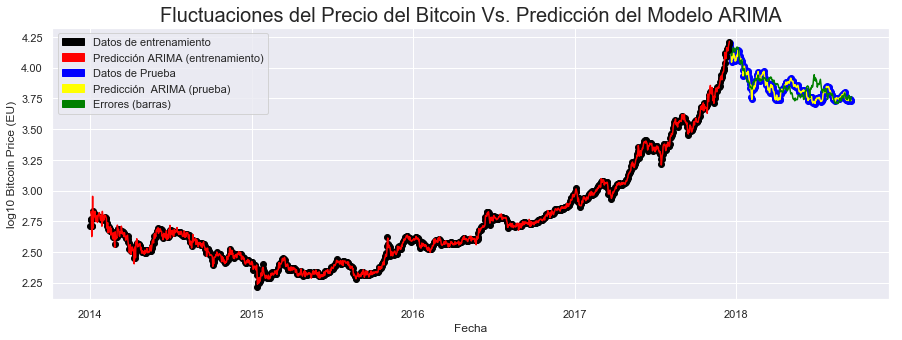

In [108]:
#Gráfico de los datos de entrenamiento y prueba

fig_2 = plt.figure()
plt.figure(figsize=(15,5))

pyplot.plot(x_test, df_test, 'o', color = 'blue')
pyplot.plot(x_test, predic_testing, 'yellow')
pyplot.plot(x_test, predic_testing_sin_ajuste_res, color='green')

pyplot.plot(x_train, df_train, 'o', color = 'black')
pyplot.plot(x_train, train_ajustada, 'red')

plt.title('Fluctuaciones del Precio del Bitcoin Vs. Predicción del Modelo ARIMA', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('log10 Bitcoin Price (EU)')
black_patch = mpatches.Patch(color='black', label='Datos de entrenamiento')
blue_patch = mpatches.Patch(color='blue', label='Datos de Prueba')

red_patch = mpatches.Patch(color='red', label='Predicción ARIMA (entrenamiento)')
yellow_patch = mpatches.Patch(color='yellow', label='Predicción  ARIMA (prueba)')

plt.legend(handles=[black_patch, red_patch, blue_patch, yellow_patch, green_patch])

plt.savefig('45_Predicion_Arima_Train&Test_log10.png')
pyplot.show()   

# Análisis para la Serie Completa

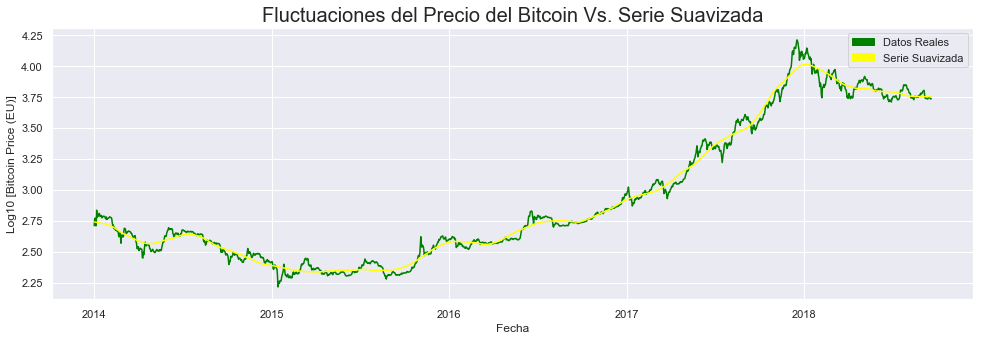

In [109]:
#Filtrado de la Señal
#Se utiliza una ventana de 733 días para no remover las altas frecuencias
serie_smooth = savgol_filter(serie_log10, 209, 3, mode='nearest')

plt.figure(figsize=(16.5,5))
pyplot.plot(mean_price_imp.index, serie_log10, color='green')
pyplot.plot(mean_price_imp.index, serie_smooth, 'yellow')

plt.title('Fluctuaciones del Precio del Bitcoin Vs. Serie Suavizada', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Log10 [Bitcoin Price (EU)]')

green_patch = mpatches.Patch(color='green', label='Datos Reales')
yellow_patch = mpatches.Patch(color='yellow', label='Serie Suavizada')
plt.legend(handles=[green_patch, yellow_patch])

plt.savefig('46_Smooth_Serie.png')
pyplot.show()

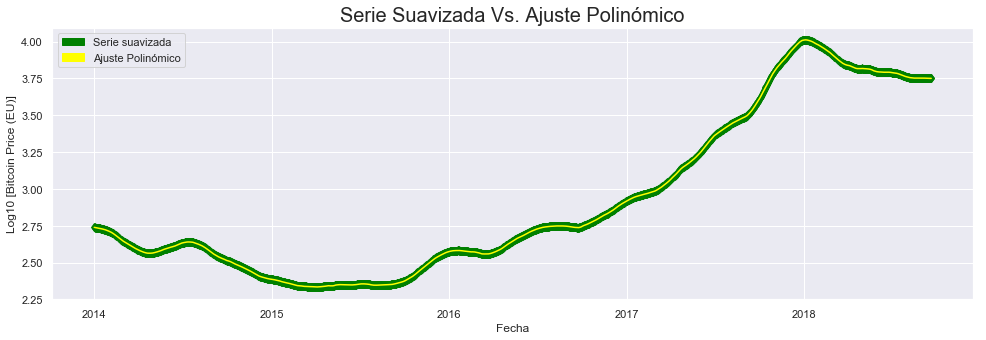

In [110]:
#Ajuste de un polinomio cuadrático a los datos suavizados

eje_x = mdates.date2num(mean_price_imp.index)

#Interpolacion de segundo orden
fit_f1 = interpolate.interp1d(eje_x, serie_smooth, kind='quadratic', fill_value='extrapolate') 

plt.figure(figsize=(16.5,5))
pyplot.plot(mean_price_imp.index, serie_smooth, 'd', color='green')
pyplot.plot(mean_price_imp.index, fit_f1(eje_x), 'yellow')

plt.title('Serie Suavizada Vs. Ajuste Polinómico', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Log10 [Bitcoin Price (EU)]')

green_patch = mpatches.Patch(color='green', label='Serie suavizada')
red_patch = mpatches.Patch(color='yellow', label='Ajuste Polinómico')
plt.legend(handles=[green_patch, red_patch])

plt.savefig('47_Polyfit_Smooth_Serie.png')
pyplot.show() 

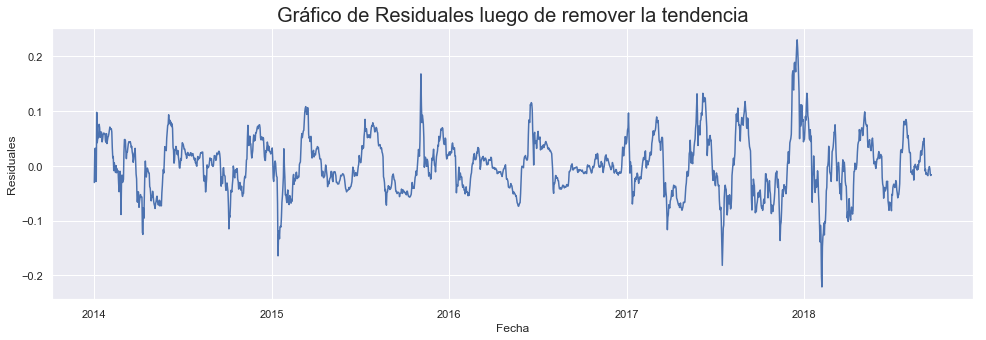

In [111]:
#Gráafico de residuales

Res_global = serie_log10 - fit_f1(eje_x)

plt.figure(figsize=(16.5,5))
pyplot.plot(mean_price_imp.index, Res_global)
plt.title('Gráfico de Residuales luego de remover la tendencia', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Residuales')

plt.savefig('48_Res_Serie.png')
pyplot.show() 

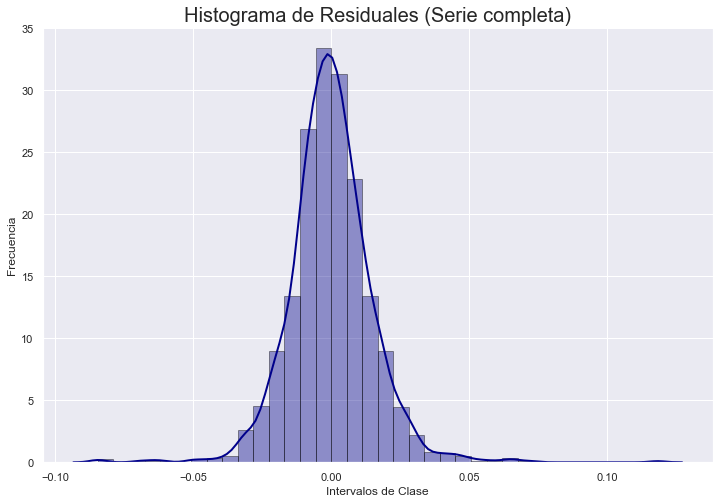

In [112]:
#Histograma de los residuales de la serie completa

fig = plt.figure(figsize=(12,8))
sns.distplot(train_residual, hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2}).set_title('Histograma de Residuales (Serie completa)', fontsize=20)
plt.xlabel('Intervalos de Clase')
plt.ylabel('Frecuencia')
plt.grid(True)

plt.savefig('49_Hist_Res_Serie.png')
pyplot.show()

In [113]:
#Test de normalidad
media_full = np.mean(serie_log10)
tstudent_full = stats.ttest_1samp(fit_f1(eje_x), media_full, axis = 0 )
print('\033[1m'+ 'Student’s T-Test para los datos de Entrenamiento' +'\033[0m')
print(tstudent_full)

#Analisis F-Test
print('\033[1m'+ 'F-statistic para los datos de Entrenamiento' +'\033[0m')
f_test_full = stats.f_oneway(serie_log10, fit_f1(eje_x))
print(f_test_full)

Student’s T-Test para los datos de Entrenamiento
Ttest_1sampResult(statistic=-0.053359128699584875, pvalue=0.9574519586530736)
F-statistic para los datos de Entrenamiento
F_onewayResult(statistic=0.0014153372489556775, pvalue=0.9699920699511364)


# Remoción de la Estacionalidad para: 724, 206, 111, 63 y 483 días

In [114]:
#Remocion de estacionalidad para una frecuencia de 724 dias

season_724 = seasonal_decompose(Res_global,freq=724)
Res_global_724 = Res_global - season_724.seasonal

In [115]:
#Remocion de estacionalidad para una frecuencia de 206 dias

season_206 = seasonal_decompose(Res_global, freq=206)
Res_global_724_206 = Res_global_724 - season_206.seasonal

In [116]:
#Remocion de estacionalidad para una frecuencia de 111 dias

season_111 = seasonal_decompose(Res_global, freq=111)
Res_global_724_206_111 = Res_global_724_206 - season_111.seasonal

In [117]:
#Remocion de estacionalidad para una frecuencia de 63 dias

season_63 = seasonal_decompose(Res_global, freq=63)
Res_global_724_206_111_63 = Res_global_724_206_111 - season_63.seasonal

In [118]:
#Remocion de estacionalidad para una frecuencia de 483 dias

season_483 = seasonal_decompose(Res_global, freq=483)
Res_global_724_206_111_63_483 = Res_global_724_206_111_63 - season_483.seasonal

# Predicción de la serie completa con ARIMA

In [119]:
#Prediccion y analisis de errores con Arima (datos completos)
#La diferenciacion se incluye dentro del modelo
predic_full= p_arima(Res_global_724_206_111_63_483, Res_global_724_206_111_63_483)

In [120]:
#Ajuste del modelo Arima
model_comp = ARIMA(Res_global_724_206_111_63_483, order=(2,1,0))
model_fit_comp = model_comp.fit(disp=0)
result_pred = model_fit_comp.predict()
# print summary of fit model
print(model_fit_comp.summary())

                              ARIMA Model Results                              
Dep. Variable:     D.avg_btc_price_eur   No. Observations:                 1722
Model:                  ARIMA(2, 1, 0)   Log Likelihood                4712.968
Method:                        css-mle   S.D. of innovations              0.016
Date:                 Thu, 20 Sep 2018   AIC                          -9417.937
Time:                         16:35:19   BIC                          -9396.132
Sample:                     01-02-2014   HQIC                         -9409.870
                          - 09-19-2018                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                      8.319e-05      0.000      0.210      0.834      -0.001       0.001
ar.L1.D.avg_btc_price_eur     0.1669      0.024      6.944      0.000       0.

Test MSE: 0.000
Error MAE del Modelo: 0.012


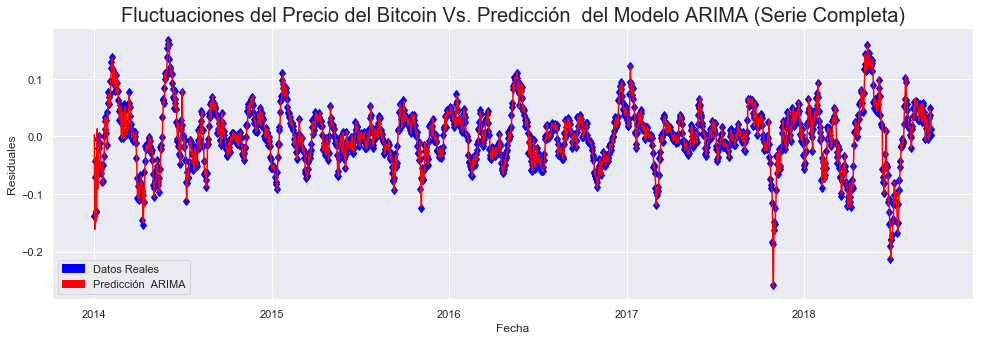

In [121]:
#Graficos de ajuste
predic_full = np.asarray(predic_full)
predic_full =  predic_full.reshape((predic_full.shape[0],))

res_model = Res_global_724_206_111_63_483 - predic_full

error = mean_squared_error(Res_global_724_206_111_63_483, predic_full)
MAE_error = mean_absolute_error(Res_global_724_206_111_63_483, predic_full)

print('Test MSE: %.3f' % error)
print('Error MAE del Modelo: %.3f' % MAE_error)

# plot
plt.figure(figsize=(16.5,5))
pyplot.plot(mean_price_imp.index, Res_global_724_206_111_63_483, 'd', color= 'blue')
pyplot.plot(mean_price_imp.index, predic_full, color='red')

plt.title('Fluctuaciones del Precio del Bitcoin Vs. Predicción  del Modelo ARIMA (Serie Completa)', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Residuales')
red_patch = mpatches.Patch(color='red', label='Predicción  ARIMA')
blue_patch = mpatches.Patch(color='blue', label='Datos Reales')
plt.legend(handles=[blue_patch, red_patch])

plt.savefig('50_Predic_Arima_Res_Serie_Completa.png')
pyplot.show()

# Predicción del Precio del Bitcoin Futuro

In [122]:
#Creacion de la ventana temporal de predicción para 7 días
import datetime
last_day = x_test[-1]+1
print(last_day )
time_start = last_day
time_end = time_start + timedelta(7)
date_list = [time_start + timedelta(days=x) for x in range(0, 7)]
num_date = mdates.date2num(date_list)
print(date_list)

2018-09-20 00:00:00
[Timestamp('2018-09-20 00:00:00', freq='D'), Timestamp('2018-09-21 00:00:00', freq='D'), Timestamp('2018-09-22 00:00:00', freq='D'), Timestamp('2018-09-23 00:00:00', freq='D'), Timestamp('2018-09-24 00:00:00', freq='D'), Timestamp('2018-09-25 00:00:00', freq='D'), Timestamp('2018-09-26 00:00:00', freq='D')]


In [141]:
#Creacion de la ventana temporal de predicción para n días
import datetime
n=7
last_day = x_test[-1]+1
print(last_day )
time_start = last_day
time_end = time_start + timedelta(n)
date_list = [time_start + timedelta(days=x) for x in range(0, n)]
num_date = mdates.date2num(date_list)
print(date_list)

2018-09-20 00:00:00
[Timestamp('2018-09-20 00:00:00', freq='D'), Timestamp('2018-09-21 00:00:00', freq='D'), Timestamp('2018-09-22 00:00:00', freq='D'), Timestamp('2018-09-23 00:00:00', freq='D'), Timestamp('2018-09-24 00:00:00', freq='D'), Timestamp('2018-09-25 00:00:00', freq='D'), Timestamp('2018-09-26 00:00:00', freq='D')]


[0.00306316 0.00463712 0.00484024 0.0047649  0.00480727 0.00490263
 0.00499273]


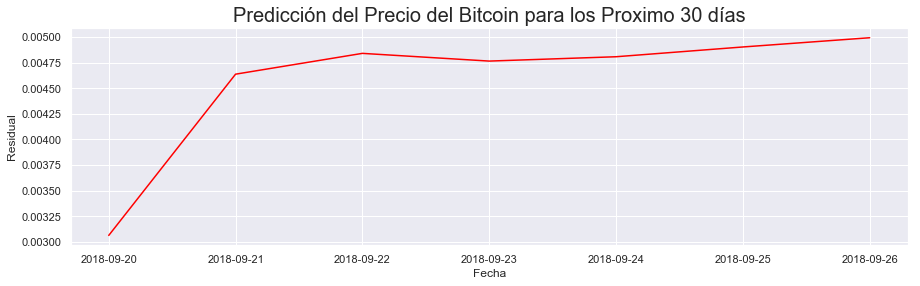

In [142]:
#Prediccion de 7 valores hacia adelante
long_res = len(Res_global_724_206_111_63_483[0:data_end])
new_list =  [long_res + x for x in range(0, n)]

arima_mod_7d = ARIMA(Res_global_724_206_111_63_483, order=(2,1,0)).fit()

predictions = list()
#predictions = arima_mod_7d.predict(start=new_list[0], end=new_list[-1]) 
predictions = arima_mod_7d.forecast(len(new_list))
print(predictions[0])

plt.figure(figsize=(15,4))
pyplot.plot(date_list, predictions[0], color='red')
plt.title('Predicción del Precio del Bitcoin para los Proximo 30 días', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Residual')

plt.savefig('51_Predic_Arima_Res_7_dias.png')
pyplot.show()   

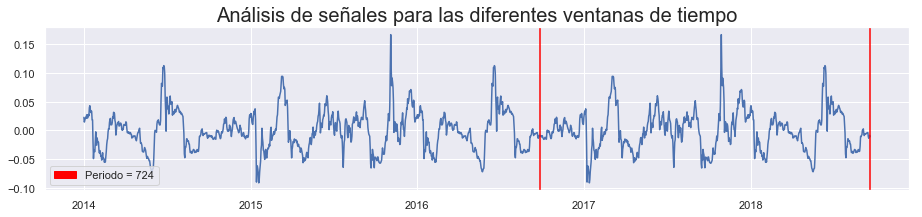

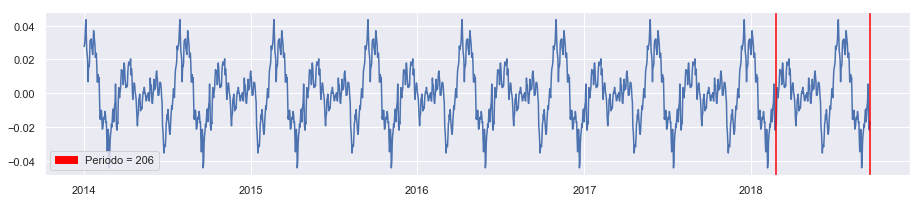

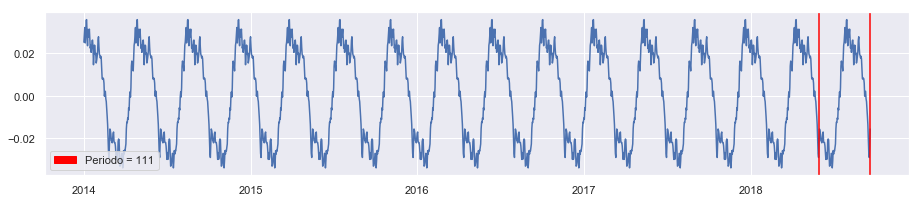

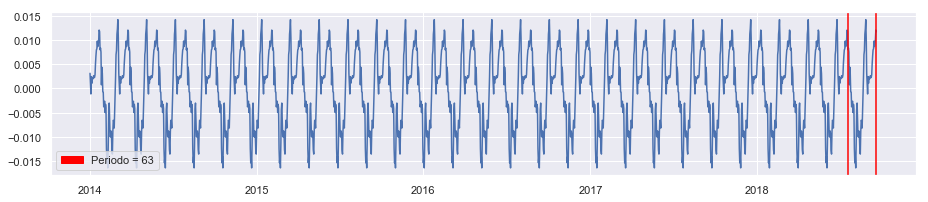

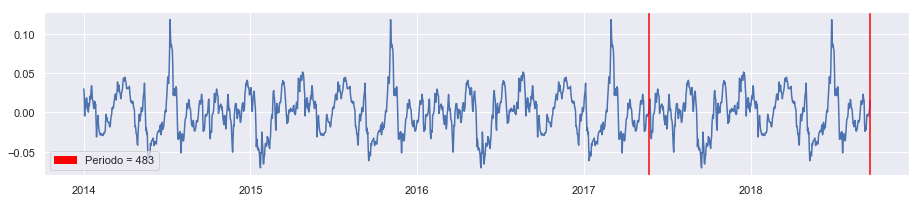

In [143]:
#Analisis del inicio de cada periodo para las diferentes señales
final_serie = mean_price_imp.index[-1]
x_long = len(mean_price_imp.index)
time_ref1 = final_serie - timedelta(724)

plt.figure(figsize=(15.5,3))
plt.title('Análisis de señales para las diferentes ventanas de tiempo', fontsize=20)
pyplot.plot(mean_price_imp.index, season_724.seasonal)
plt.axvline(x=final_serie, color = 'red')
plt.axvline(x=time_ref1, color = 'red')
red_patch = mpatches.Patch(color='red', label='Periodo = 724')
plt.legend(handles=[red_patch], loc=3)


#Serie de periodo 206 días
time_ref2 = final_serie - timedelta(206)

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_206.seasonal)
plt.axvline(x=final_serie, color = 'red')
plt.axvline(x=time_ref2, color = 'red')
red_patch = mpatches.Patch(color='red', label='Periodo = 206')
plt.legend(handles=[red_patch], loc=3)


#Serie de periodo 111 días
time_ref3 = final_serie - timedelta(111)

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_111.seasonal)
plt.axvline(x=final_serie, color = 'red')
plt.axvline(x=time_ref3, color = 'red')
red_patch = mpatches.Patch(color='red', label='Periodo = 111')
plt.legend(handles=[red_patch], loc=3)


#Serie de periodo 63 días
time_ref4 = final_serie - timedelta(63)

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_63.seasonal)
plt.axvline(x=final_serie, color = 'red')
plt.axvline(x=time_ref4, color = 'red')
red_patch = mpatches.Patch(color='red', label='Periodo = 63')
plt.legend(handles=[red_patch], loc=3)


#Serie de periodo 483 días
time_ref5 = final_serie - timedelta(483)

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_483.seasonal)
plt.axvline(x=final_serie, color = 'red')
plt.axvline(x=time_ref5, color = 'red')
red_patch = mpatches.Patch(color='red', label='Periodo = 483')
plt.legend(handles=[red_patch], loc=3) 

pyplot.show()


1723
<class 'tuple'>


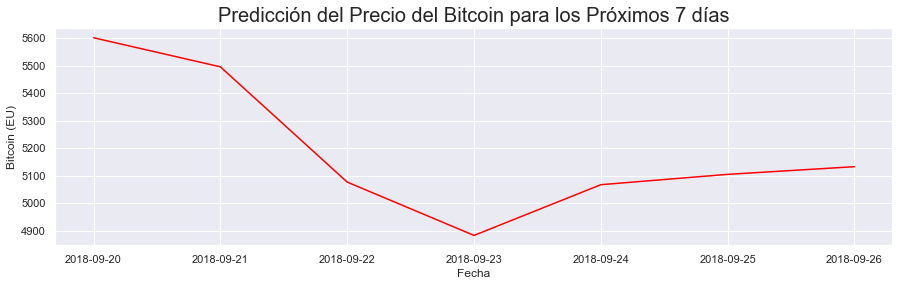

2018-09-19 00:00:00


In [146]:
#Seleccion de ventana para ajuste de tendencia 
long = len(Res_global_724_206_111_63_483[0:data_end])
print(long)
w1 = long - 724
w2 = long - 206
w3 = long - 111
w4 = long - 63
w5 = long - 483

#Incorporacion de la frecuencia propia de cada periodo
data_1 = season_724.seasonal[w1:(w1+n)]
data_1 = np.asarray(data_1)
data_2 = season_206.seasonal[w2:(w2+n)]
data_2 = np.asarray(data_2)
data_3 = season_111.seasonal[w3:(w3+n)]
data_3 = np.asarray(data_3)
data_4 = season_63.seasonal[w4:(w4+n)]
data_4 = np.asarray(data_4)
data_5 = season_483.seasonal[w5:(w5+n)]
data_5 = np.asarray(data_5)

#poly_trend = fit_full(num_date)
tendencia = fit_f1(num_date)

print(type(predictions ))

prediccion = data_1  + data_2 + data_3 + data_4 + data_5 + predictions[0] +  tendencia

prediccion_2 =  10**prediccion


plt.figure(figsize=(15,4))
pyplot.plot(date_list, prediccion_2, color='red')
plt.title('Predicción del Precio del Bitcoin para los Próximos 7 días', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Bitcoin (EU)')
plt.savefig('51b_Predic_Arima_Res_7_dias_EU.png')
pyplot.show() 
print(mean_price_imp.index[-1])
np.savetxt('Arima_Simple.txt', prediccion_2, delimiter=',')  

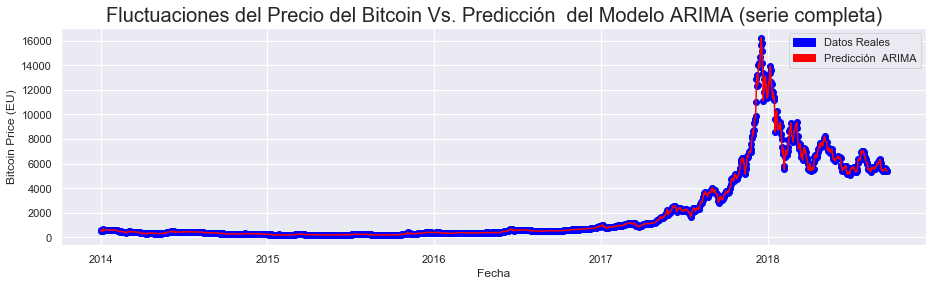

In [148]:
#Reconstruccion de los datos de la serie completa
predic_full=np.asarray(predic_full)
predic_full = predic_full.reshape((predic_full.shape[0],))

reconst_serie = predic_full + season_483.seasonal + season_63.seasonal + season_206.seasonal + season_111.seasonal + season_724.seasonal+fit_f1(eje_x)

reconst_serie = reconst_serie + res_model

#Funcion para revertir el cambio
reconst_serie_2 = 10**reconst_serie

plt.figure(figsize=(15.5,4))
pyplot.plot(mean_price_imp.index, mean_price_imp, 'o', color='blue')
pyplot.plot(mean_price_imp.index, reconst_serie_2, color='red')
plt.title('Fluctuaciones del Precio del Bitcoin Vs. Predicción  del Modelo ARIMA (serie completa)', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Bitcoin Price (EU)')
red_patch = mpatches.Patch(color='red', label='Predicción  ARIMA')
blue_patch = mpatches.Patch(color='blue', label='Datos Reales')
plt.legend(handles=[blue_patch, red_patch])

plt.savefig('51c_Serie_Completa_EU.png')
pyplot.show() 


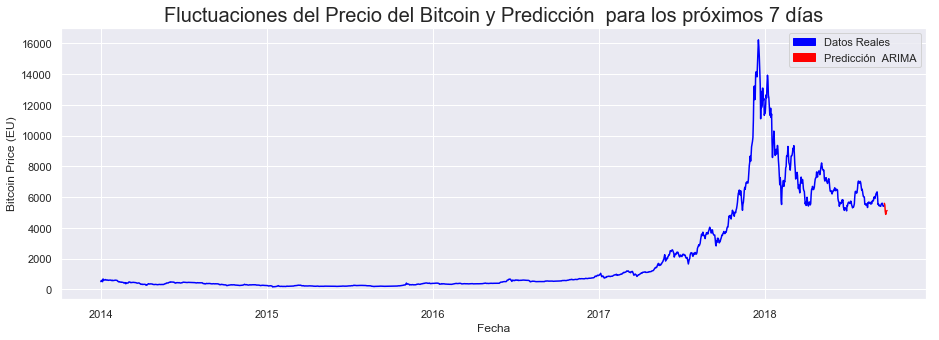

In [149]:
plt.figure(figsize=(15.5,5))
pyplot.plot(mean_price_imp.index[0:data_end], reconst_serie_2[0:data_end], 'blue')
pyplot.plot(date_list, prediccion_2, 'red')
plt.title('Fluctuaciones del Precio del Bitcoin y Predicción  para los próximos 7 días', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Bitcoin Price (EU)')
red_patch = mpatches.Patch(color='red', label='Predicción  ARIMA')
blue_patch = mpatches.Patch(color='blue', label='Datos Reales')
plt.legend(handles=[blue_patch, red_patch])
plt.savefig('51d_Predicciones_Serie_Completa_EU.png')
pyplot.show()

# Extracción de Datos de Google Trend

            Bitcoin  isPartial
date                          
2014-01-05        6      False
2014-01-12        6      False
2014-01-19        7      False
2014-01-26        7      False
2014-02-02        6      False


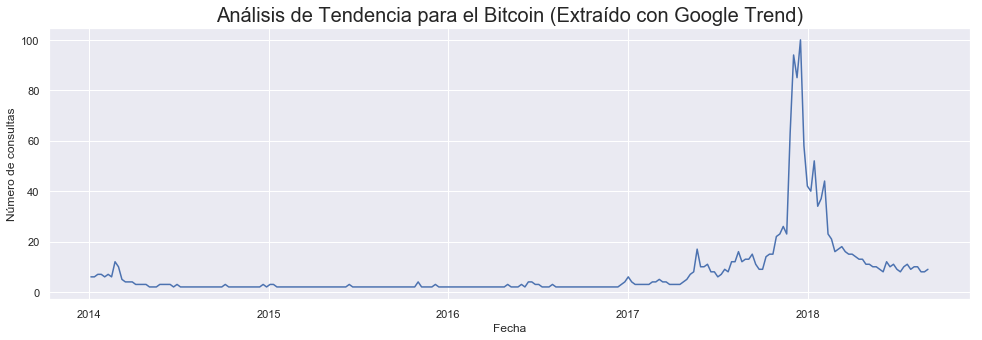

In [150]:
from pytrends.request import TrendReq
import pandas as pd

keyword = 'Bitcoin'
pytrend = TrendReq(hl='de-CH')

time_ini = '2014-01-01'
time_end = time_start + timedelta(7)
date_list = [time_start + timedelta(days=x) for x in range(0, n)]


pytrend.build_payload(kw_list=[keyword], timeframe='2014-01-01 2018-09-06', geo='US')

# Interest Over Time
interest_over_time_df = pytrend.interest_over_time()
print(interest_over_time_df.head())

plt.figure(figsize=(16.5,5))
pyplot.plot(interest_over_time_df.index, interest_over_time_df.Bitcoin)
plt.title('Análisis de Tendencia para el Bitcoin (Extraído con Google Trend)', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Número de consultas')
plt.savefig('51e_Google_tred.png')
pyplot.show() 

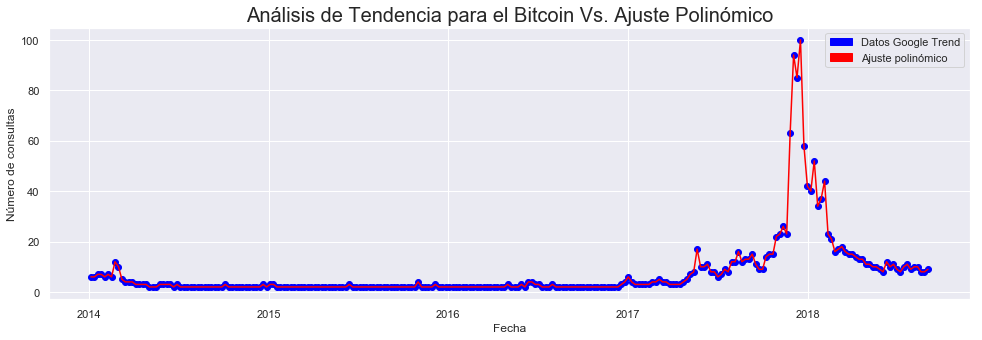

In [151]:
#Estructuracion de los datos

from scipy.interpolate import interp1d
from scipy import interpolate

x_date = mdates.date2num(interest_over_time_df.index)

y_bitcoin = interest_over_time_df.Bitcoin

f1 = interpolate.interp1d(x_date, y_bitcoin, kind='quadratic', fill_value= 'extrapolate')

plt.figure(figsize=(16.5,5))
pyplot.plot(interest_over_time_df.index, interest_over_time_df.Bitcoin, 'o', color ='blue')
pyplot.plot(interest_over_time_df.index, f1(x_date), 'red')
plt.title('Análisis de Tendencia para el Bitcoin Vs. Ajuste Polinómico', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Número de consultas')
red_patch = mpatches.Patch(color='red', label='Ajuste polinómico')
blue_patch = mpatches.Patch(color='blue', label='Datos Google Trend')
plt.legend(handles=[blue_patch, red_patch])

plt.savefig('57_Google_trend&Polyfit.png')
pyplot.show() 


In [134]:
#Generacion de datos de tendencia dia por dia
y_trend_synt = f1(eje_x)
y_trend_synt= y_trend_synt[0:data_end]
print(len(y_trend_synt))

1723


Análisis de Correlación de Pearson
(0.8092773813013243, 0.0)


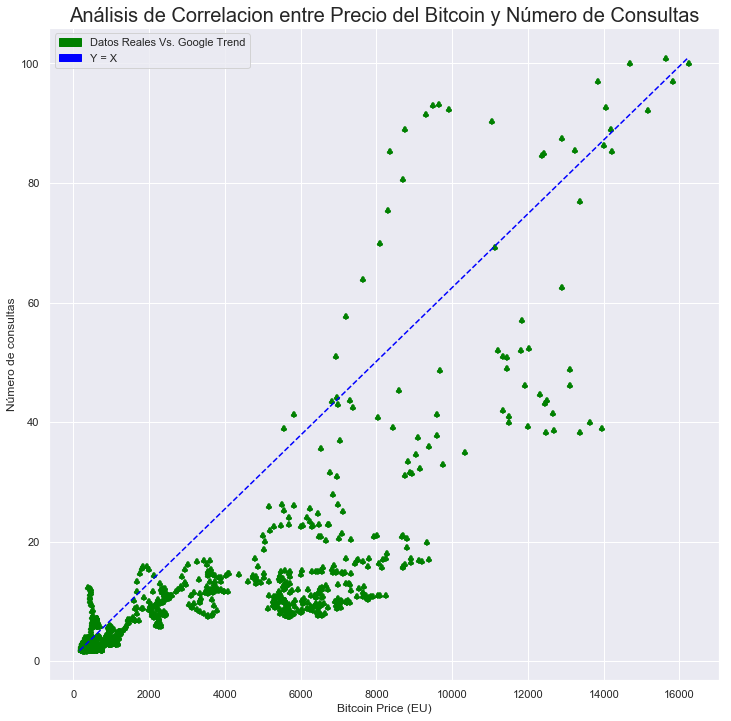

In [152]:
#Estimacion del coeficiente de correlación
from scipy.stats.stats import pearsonr

real_data = np.asarray(mean_price_imp.values)[0:data_end]
real_data = real_data.reshape((real_data.shape[0],))

print('\033[1m'+ 'Análisis de Correlación de Pearson' +'\033[0m')
correlacion = pearsonr(real_data, y_trend_synt)
print(correlacion)

#Construccion de recta de 45 grados
mean, cov = [0, 0], [(1, .6), (.6, 1)]
x, y = np.random.multivariate_normal(mean, cov, 100).T
y += x + 1
f, ax = plt.subplots(figsize=(12, 12))
plt.scatter(mean_price_imp.values[0:data_end], y_trend_synt,  marker=r'$\clubsuit$', c='green')

ax.plot([min(mean_price_imp.values), max(mean_price_imp.values)], [min(y_trend_synt), max(y_trend_synt)], ls="--", c=".8", color = 'blue')
plt.title('Análisis de Correlacion entre Precio del Bitcoin y Número de Consultas', fontsize=20)
plt.xlabel('Bitcoin Price (EU)')
plt.ylabel('Número de consultas')
green_patch = mpatches.Patch(color='green', label='Datos Reales Vs. Google Trend')
blue_patch = mpatches.Patch(color='blue', label='Y = X')
plt.legend(handles=[green_patch, blue_patch])

plt.savefig('58_Google_correlation.png')
pyplot.show() 

# Ajuste con una Variable Exógena

In [153]:
model_comp = ARIMA(Res_global_724_206_111_63_483[0:data_end], order=(2,1,0), exog = y_trend_synt)

model_fit_comp2 = model_comp.fit(disp=0)
result_pred2 = model_fit_comp.predict()
# print summary of fit model
print(model_fit_comp2.summary())


                              ARIMA Model Results                              
Dep. Variable:     D.avg_btc_price_eur   No. Observations:                 1722
Model:                  ARIMA(2, 1, 0)   Log Likelihood                4712.975
Method:                        css-mle   S.D. of innovations              0.016
Date:                 Thu, 20 Sep 2018   AIC                          -9415.951
Time:                         16:46:56   BIC                          -9388.695
Sample:                     01-02-2014   HQIC                         -9405.867
                          - 09-19-2018                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                         0.0001      0.000      0.242      0.809      -0.001       0.001
x1                        -3.679e-06   3.07e-05     -0.120      0.905   -6.38e

In [154]:
#Prediccion utilizando una variable exógena

arima_mod = ARIMA(Res_global_724_206_111_63_483[0:data_end], order=(2,1,0), exog = y_trend_synt).fit()

predictions_ex = list()
predictions_ex = arima_mod.predict(start=new_list[0], end=new_list[-1], exog = y_trend_synt) 

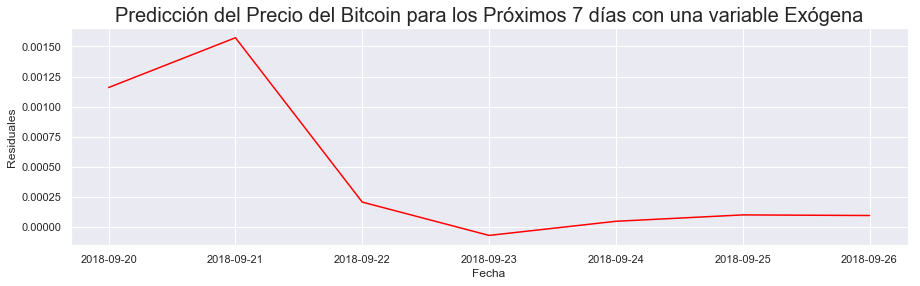

In [155]:
plt.figure(figsize=(15,4))
pyplot.plot(date_list, predictions_ex, color='red')
plt.title('Predicción del Precio del Bitcoin para los Próximos 7 días con una variable Exógena', fontsize=20)
plt.xlabel('Fecha') 
plt.ylabel('Residuales')

plt.savefig('59_Arima_Var_Exogena.png')
pyplot.show() 

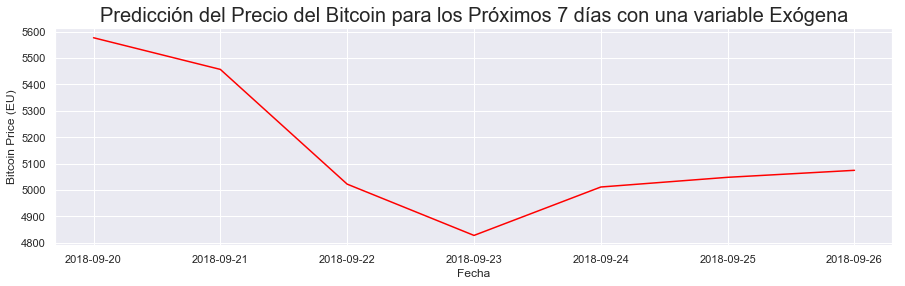

In [156]:
prediccion_ex = predictions_ex.values + data_1  + data_2 + data_3 + data_4 + data_5 + tendencia

prediccion_ex2 =  10**prediccion_ex

plt.figure(figsize=(15,4))
pyplot.plot(date_list, prediccion_ex2, color='red')
plt.title('Predicción del Precio del Bitcoin para los Próximos 7 días con una variable Exógena', fontsize=20)
plt.xlabel('Fecha') 
plt.ylabel('Bitcoin Price (EU)')

#plt.savefig('60_Arima_Var_Exogena_EU.png')
plt.savefig('60_30_Arima_Var_Exogena_EU.png')
pyplot.show()   
np.savetxt('Arima_Ex.txt', prediccion_ex2, delimiter=',')  

In [ ]:
print(precio_real)

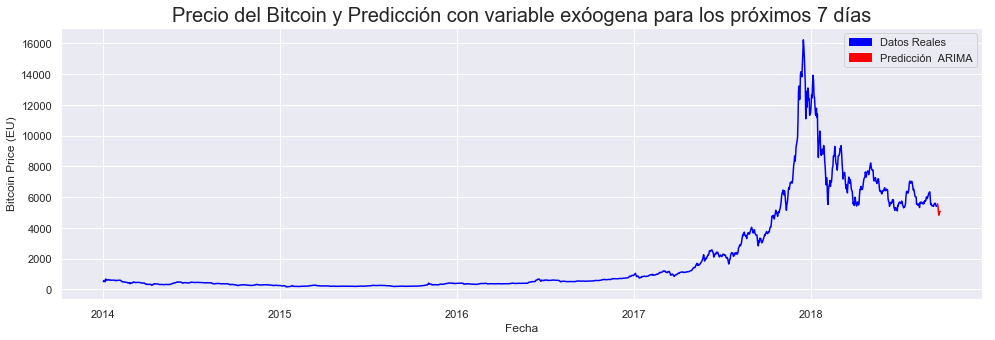

In [158]:
plt.figure(figsize=(16.5,5))
pyplot.plot(mean_price_imp.index[0:data_end], reconst_serie_2[0:data_end], 'blue')
pyplot.plot(date_list, prediccion_ex2, 'red')
plt.title('Precio del Bitcoin y Predicción con variable exóogena para los próximos 7 días', fontsize=20)
plt.xlabel('Fecha')
plt.ylabel('Bitcoin Price (EU)')
red_patch = mpatches.Patch(color='red', label='Predicción  ARIMA')
blue_patch = mpatches.Patch(color='blue', label='Datos Reales')
plt.legend(handles=[blue_patch, red_patch])

plt.savefig('61_Serie&Predic_Exogena_EU.png')
pyplot.show() 

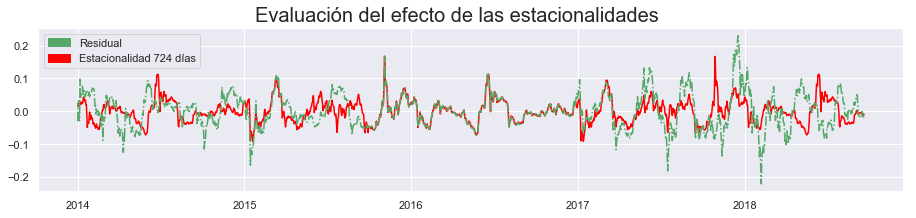

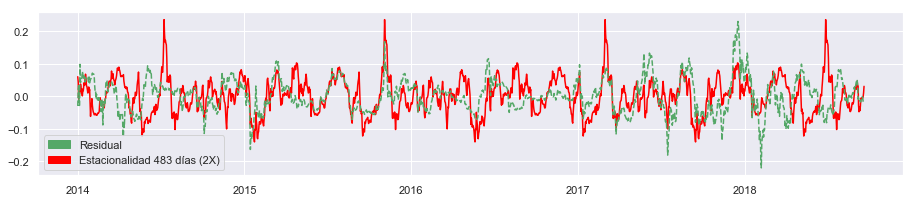

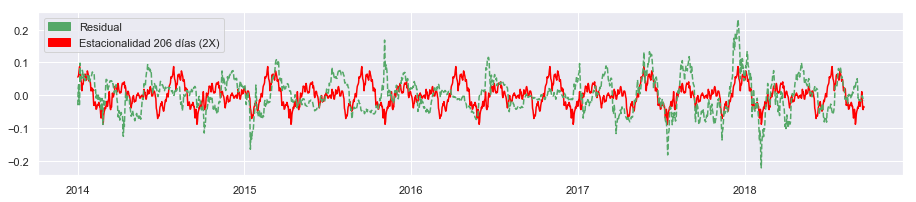

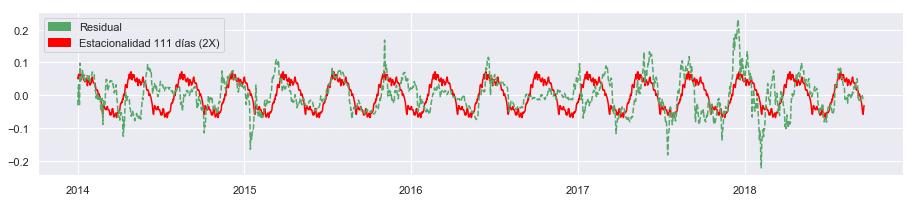

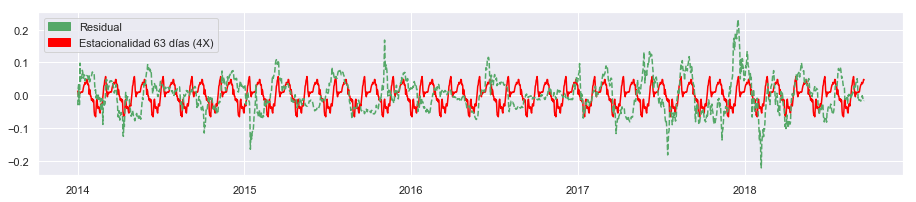

In [159]:
plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_724.seasonal, color ='red')
pyplot.plot(mean_price_imp.index, Res_global, '-.', color= 'g')
green_patch = mpatches.Patch(color='g', label='Residual')
red_patch = mpatches.Patch(color='red', label='Estacionalidad 724 días')
plt.legend(handles=[green_patch, red_patch])
plt.suptitle('Evaluación del efecto de las estacionalidades', fontsize=20)

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_483.seasonal*2, color ='red')
pyplot.plot(mean_price_imp.index, Res_global, '--', color= 'g')
green_patch = mpatches.Patch(color='g', label='Residual')
red_patch = mpatches.Patch(color='red', label='Estacionalidad 483 días (2X)')
plt.legend(handles=[green_patch, red_patch])

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_206.seasonal*2, color ='red')
pyplot.plot(mean_price_imp.index, Res_global, '--', color= 'g')
green_patch = mpatches.Patch(color='g', label='Residual')
red_patch = mpatches.Patch(color='red', label='Estacionalidad 206 días (2X)')
plt.legend(handles=[green_patch, red_patch])

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_111.seasonal*2, color ='red')
pyplot.plot(mean_price_imp.index, Res_global, '--', color= 'g')
green_patch = mpatches.Patch(color='g', label='Residual')
red_patch = mpatches.Patch(color='red', label='Estacionalidad 111 días (2X)')
plt.legend(handles=[green_patch, red_patch])

plt.figure(figsize=(15.5,3))
pyplot.plot(mean_price_imp.index, season_63.seasonal*4, color ='red')
pyplot.plot(mean_price_imp.index, Res_global, '--', color= 'g')
green_patch = mpatches.Patch(color='g', label='Residual')
red_patch = mpatches.Patch(color='red', label='Estacionalidad 63 días (4X)')
plt.legend(handles=[green_patch, red_patch])
plt.show()

# Validación Cruzada (*k-fold CV*)

Observations: 575
Training Observations: 288
Testing Observations: 287
Observations: 862
Training Observations: 575
Testing Observations: 287
Observations: 1149
Training Observations: 862
Testing Observations: 287
Observations: 1436
Training Observations: 1149
Testing Observations: 287
Observations: 1723
Training Observations: 1436
Testing Observations: 287


<Figure size 432x288 with 0 Axes>

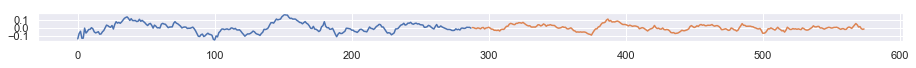

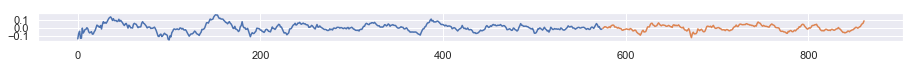

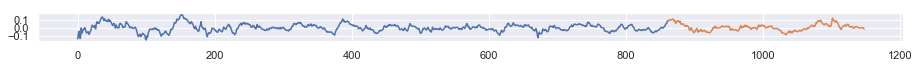

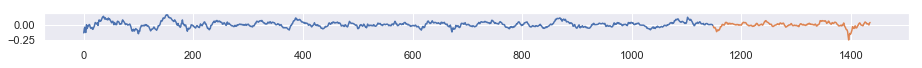

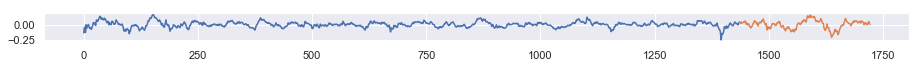

In [160]:
from pandas import Series
from sklearn.model_selection import TimeSeriesSplit
from matplotlib import pyplot
X = Res_global_724_206_111_63_483.values
splits = TimeSeriesSplit(n_splits=5)
pyplot.figure(1)
index = 1
for train_index, test_index in splits.split(X):
	train = X[train_index]
	test = X[test_index]
	print('Observations: %d' % (len(train) + len(test)))
	print('Training Observations: %d' % (len(train)))
	print('Testing Observations: %d' % (len(test)))
	plt.figure(figsize=(15.5,3))
	pyplot.subplot(510 + index)
	pyplot.plot(train)
	pyplot.plot([None for i in train] + [x for x in test])
	index += 1
pyplot.show()


In [161]:
def masks(vec):
    d = np.diff(vec)
    dd = np.diff(d)

    # Mask of locations where graph goes to vertical or horizontal, depending on vec
    to_mask = ((d[:-1] != 0) & (d[:-1] == -dd))
    # Mask of locations where graph comes from vertical or horizontal, depending on vec
    from_mask = ((d[1:] != 0) & (d[1:] == dd))
    return to_mask, from_mask

In [162]:
data = mean_price_imp["avg_btc_price_eur"].values

eje_x = mdates.date2num(mean_price_imp["avg_btc_price_eur"].index)
#eje_x = pd.DataFrame({'fecha':eje_x})

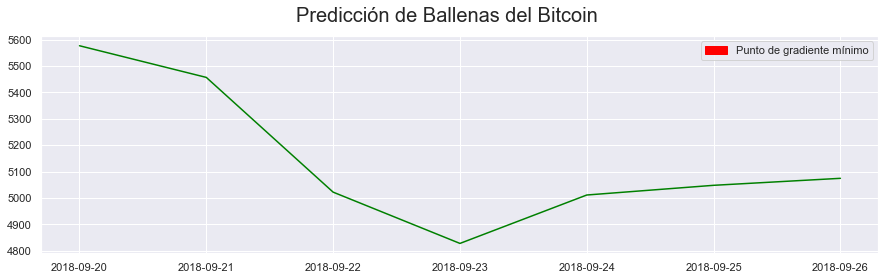

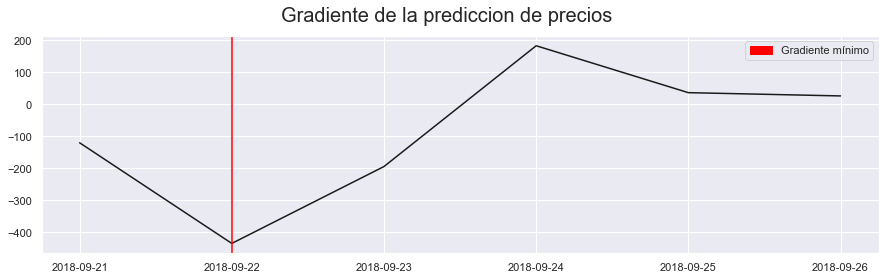

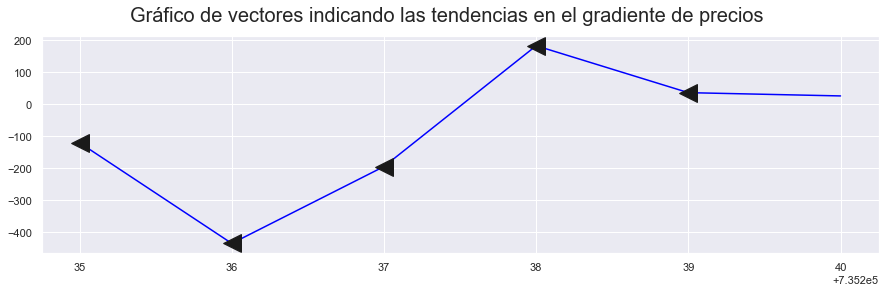

In [169]:
y = np.diff(prediccion_ex2)
y =list(y)
minpos = y.index(np.min(y))
maxpos = y.index(np.max(y))

minimo = y[minpos]
maximo = y[maxpos]
x_min = date_list[minpos]
x_max= date_list[maxpos]

plt.figure(figsize=(15,4))
pyplot.plot(date_list, prediccion_ex2, color='green')


red_patch = mpatches.Patch(color='red', label='Punto de gradiente mínimo')
plt.legend(handles=[red_patch])
plt.suptitle('Predicción de Ballenas del Bitcoin', fontsize=20)
plt.show()
plt.figure(figsize=(15,4))
pyplot.plot(date_list[1:len(date_list)], y, color='k')
plt.axvline(x=x_min+timedelta(1), color = 'red')
red_patch = mpatches.Patch(color='red', label='Gradiente mínimo')
plt.legend(handles=[red_patch])
plt.suptitle('Gradiente de la prediccion de precios', fontsize=20)
plt.show()

import numpy as np
import matplotlib.pyplot as plt; plt.ion()
from matplotlib.patches import FancyArrowPatch

x = eje_x[1:7]


# use masked arrays
x1 = np.ma.masked_array(x[:-1], np.diff(x)>=0)
x2 = np.ma.masked_array(x[:-1], np.diff(x)<=0)

# print the line and the markers in seperate steps
plt.figure(figsize=(15,4))
plt.plot(x, y, '-', color ='blue')


plt.plot(x1, y[:-1], 'k>', markersize = 18)
plt.plot(x2, y[:-1], 'k<', markersize = 18)
plt.suptitle('Gráfico de vectores indicando las tendencias en el gradiente de precios', fontsize=20)
plt.show()